In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
!pip install normflows nflows einops ipdb torchsde torchdiffeq

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.3/65.3 kB 6.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.2/61.2 kB 10.6 MB/s eta 0:00:00
  Created wheel for normflows: filename=normflows-1.7.3-py2.py3-none-any.whl size=87246 sha256=1c0971186795c47e4dffddb0eac21cfb0664abfed04fbfb55582356287de3910
  Stored in directory: /home/ray/.cache/pip/wheels/34/b2/f3/e97b5a749e1b93adfdca027b9050d0ee4d4790c5a5dec45a6d
  Created wheel for nflows: filename=nflows-0.14-py3-none-any.whl size=53653 sha256=126397171784ff04d931695d3a65b25e73fcc83b89ada616ab06dba6fa9d9b57
  Stored in directory: /home/ray/.cache/pip/wheels/3b/88/52/cbd4ed0597b48916de3de19b28d7297c72595f56085068c772
Successfully built normflows nflows

[notice] A new release of pip

In [3]:
!pip install torch==2.0.1+cu118 --index-url https://download.pytorch.org/whl/cu118

Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 GB 431.8 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 MB 31.6 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: torch
    Found existing installation: torch 2.1.0+rocm5.6
    Uninstalling torch-2.1.0+rocm5.6:
      Successfully uninstalled torch-2.1.0+rocm5.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pytorch-lightning 1.6.5 requires protobuf<=3.20.1, but you have protobuf 3.20.3 which is incompatible.
pytorch-lightning 1.6.5 requires PyYAML>=5.4, but you have pyyaml 5.3.1 which is incompatible.
torchtext 0.14.0 requires torch==1.13.0, but you have torch 2.0.1+cu118 which is incompatible.
torchvision 0.14.0+cu116 requires torch==1.13.0, but you have torch 2.0.1+cu118 which is incompatible.

[notice] A new r

In [296]:
import normflows as nf
import matplotlib.pyplot as plt
import torch
import numpy as np
from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader
from fab import FABModel, HamiltonianMonteCarlo, Metropolis
from fab.utils.logging import ListLogger
from fab.utils.plotting import plot_history, plot_contours, plot_marginal_pair
from fab.target_distributions.gmm import GMM
from fab.utils.prioritised_replay_buffer import SimpleBuffer
from torch.autograd import grad
from fab.utils.plotting import plot_contours, plot_marginal_pair
from experiments.make_flow import make_wrapped_normflow_realnvp
import models.ddpm
import models.mlp
import pdb
from tqdm import tqdm
from models.ddpm import GaussianDiffusion, TMLP
from models.mlp import MyMLP, SpectralNormMLP, MyMLPNoSpaceEmbedding, MyMLPNoEmbedding

import torch
import torchsde

from functorch import vmap

from torchdiffeq import odeint

In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


### Target Distribution

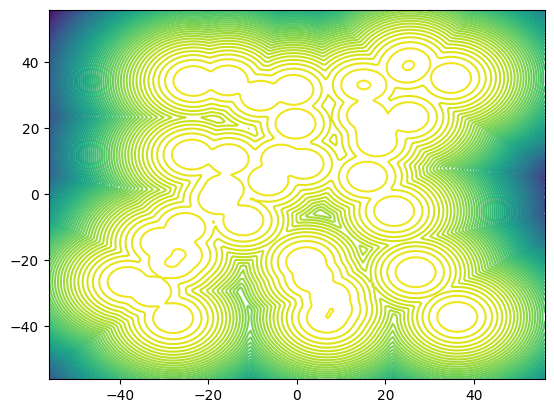

In [331]:
dim = 2
n_mixes = 40
loc_scaling = 40.0  # scale of the problem (changes how far apart the modes of each Guassian component will be)
log_var_scaling = 1.0 # variance of each Gaussian
seed = 0


if device == "cpu":
    use_gpu = False
else:
    use_gpu = True
torch.manual_seed(0)  # seed of 0 for GMM problem
target = GMM(dim=dim, n_mixes=n_mixes,
              loc_scaling=loc_scaling, log_var_scaling=log_var_scaling,
              use_gpu=use_gpu, true_expectation_estimation_n_samples=int(1e5))
# plot target
target.to("cpu")
fig, ax = plt.subplots()
plotting_bounds = (-loc_scaling * 1.4, loc_scaling * 1.4)
plot_contours(target.log_prob, bounds=plotting_bounds, n_contour_levels=80, ax=ax, grid_width_n_points=200)
target.to(device)

### Helper Functions

In [23]:
def plot_dataset(samples, gen_samples=None):
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))
    target.to("cpu")
    plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[0], n_contour_levels=50, grid_width_n_points=200)

   
    # plot dataset samples
    plot_marginal_pair(samples, ax=axs[0], bounds=plotting_bounds)
    axs[0].set_title("Buffer")

    if gen_samples is not None:
        plot_contours(target.log_prob, bounds=plotting_bounds, ax=axs[1], n_contour_levels=50, grid_width_n_points=200)
        # plot generated samples
        plot_marginal_pair(gen_samples, ax=axs[1], bounds=plotting_bounds)
        axs[1].set_title("Generated samples")

    else:
        #delete subplot
        fig.delaxes(axs[1])
        
    target.to(device)
    plt.show()
    return [fig]

In [24]:
def normalize(x):
    '''
        normalizes to [-1, 1]
    '''
    mins = -50 #torch.min(x, dim=0)[0]
    maxs = 50 #torch.max(x, dim=0)[0]
    ## [ 0, 1 ]
    x = (x - mins) / (maxs - mins + 1e-5)
    ## [ -1, 1 ]
    x = x * 2 - 1
    
    return x, mins, maxs

def unnormalize(x, mins, maxs):
    '''
        x : [ -1, 1 ]
    '''
    # assert x.max() <= 1 and x.min() >= -1, f'x range: ({x.min():.4f}, {x.max():.4f})'
    #x = x * std + mean
    x = (x + 1) / 2
    return x * (maxs - mins) + mins

## Function Definitions

### Estimated Reward Functions

In [25]:
# calculate the log expectation of the reward
def log_E_R(_x, _t, noise_schedule, num_mc_samples, global_mins=-50, global_maxs=50, var_exploding=True):
    #h_t = beta * _t.repeat_interleave(num_mc_samples).unsqueeze(1)
    
    repeated_x = _x.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    repeated_t = _t.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    
    h_t = noise_schedule.h(repeated_t)
    #h_t  = beta * repeated_t
    h_t = h_t.unsqueeze(1)
    if var_exploding:
        # variance exploding
        samples = repeated_x + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5)
        log_rewards = target.log_prob(unnormalize(samples, global_mins, global_maxs))
        log_expectation_R = torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    else:
        # variance preserving
        samples = (repeated_x/torch.sqrt(1 - repeated_t.unsqueeze(1)) 
                   + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5))
        log_rewards = target.log_prob(unnormalize(samples, global_mins, global_maxs))
        log_expectation_R = torch.log(1 / (1 - _t)) + torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    return log_expectation_R

In [26]:
def estimated_Rt(x, t, beta, num_mc_samples=100, var_exploding=True):
    if t.dim() == 0:
        # repeat the same time for all points if we have a scalar time
        t = t * torch.ones(x.shape[0]).to(device)
    return torch.vmap(log_E_R, 
                      randomness='different', in_dims=(0,0,None,None))(x, t, beta, 
                                                                       num_mc_samples, var_exploding=var_exploding)

In [27]:
def estimate_grad_Rt(x, t, noise_schedule, num_mc_samples=200, var_exploding=True, richardson=False):
    if x.ndim == 1:
        x = x.unsqueeze(0)
        t = t.unsqueeze(0)
    
    est_scores_n = torch.vmap(torch.func.grad(log_E_R), 
                            in_dims=(0,0,None,None), randomness='different')(x, t, noise_schedule, num_mc_samples, 
                                                                                  var_exploding=var_exploding)
    return est_scores_n
    norm = torch.linalg.vector_norm(est_scores_n, dim=-1)
    #print(norm.max())
    max_norm = 100
    clip_coeff = torch.clamp(max_norm / (norm+1e-6), max=1)
    clipped_f = est_scores_n * clip_coeff.unsqueeze(-1)
    
    return clipped_f#.clamp(min=-100.0, max=100.0)
    
    if richardson:
        est_scores_n_div2 = torch.vmap(torch.func.grad(log_E_R), 
                                   in_dims=(0,0,None,None), randomness='different')(x, t, beta, num_mc_samples//2, 
                                                                                         var_exploding=var_exploding)
        return (2*est_scores_n - est_scores_n_div2)
    else:
        return est_scores_n

### True Reward Functions

In [28]:
def true_Rt(x, t, noise_schedule, global_mins=-50, global_maxs=50, var_exploding=True):
    h_t = noise_schedule.h(t)
    target.convolve(h_t * (global_maxs **2), t, var_exploding=var_exploding)
    energy = target.log_prob(unnormalize(x, global_mins, global_maxs))
    target.reset()
    return energy

In [29]:
def true_grad_Rt(x, t, noise_schedule, var_exploding=True):
    samples_energy = true_Rt(x, t[0], noise_schedule, var_exploding=var_exploding)
    true_scores = torch.autograd.grad(samples_energy.sum(), x, retain_graph=True)[0].detach()
    return true_scores

## SDE Tests

### Dataset

In [30]:
# hyper-parameters

# Flow
n_flow_layers = 15
layer_nodes_per_dim = 40
lr = 1e-4
max_gradient_norm = 100.0
batch_size = 128
n_iterations = 4000
n_eval = 10
eval_batch_size = batch_size * 10
n_plots = 10 # number of plots shows throughout tranining
use_64_bit = True
alpha = 2.0
num_samples = 10000

flow = make_wrapped_normflow_realnvp(dim, n_flow_layers=n_flow_layers, 
                                 layer_nodes_per_dim=layer_nodes_per_dim,
                                act_norm = False)

/home/ray/anaconda3/lib/python3.9/site-packages/torch/_tensor.py:677: UserWarning: torch.lu is deprecated in favor of torch.linalg.lu_factor / torch.linalg.lu_factor_ex and will be removed in a future PyTorch release.
LU, pivots = torch.lu(A, compute_pivots)
should be replaced with
LU, pivots = torch.linalg.lu_factor(A, compute_pivots)
and
LU, pivots, info = torch.lu(A, compute_pivots, get_infos=True)
should be replaced with
LU, pivots, info = torch.linalg.lu_factor_ex(A, compute_pivots) (Triggered internally at ../aten/src/ATen/native/BatchLinearAlgebra.cpp:1991.)
  LU, pivots, infos = torch._lu_with_info(


In [31]:
# normalize the dataset
init_num_samples = 2048
unnorm_true_samples = target.sample(torch.tensor(init_num_samples).unsqueeze(0)).to(device).detach()
unnorm_init_samples = flow.sample((init_num_samples,)).to(device).detach()
init_energy = target.log_prob(unnorm_init_samples).detach()
init_samples, global_mins_init, global_maxs_init = normalize(unnorm_init_samples)

global_mins_init = -50
global_maxs_init = 50

init_dataset = TensorDataset(init_samples, init_energy)
init_loader = DataLoader(init_dataset, batch_size = 512, shuffle=True) 

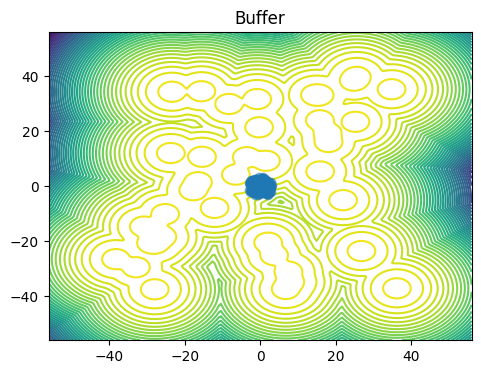

In [16]:
plot_dataset(unnorm_init_samples) # visualise the initial samples
plt.show()

### VE SDE

In [32]:
class VEReverseSDE(torch.nn.Module):
    noise_type = 'diagonal'
    sde_type = 'ito'
    
    def __init__(self, score, noise_schedule):
        super().__init__()
        self.score = score
        self.noise_schedule = noise_schedule
    
    def f(self, t, x):
        #import pdb; pdb.set_trace()
        with torch.enable_grad():
            if t.dim() == 0:
                # repeat the same time for all points if we have a scalar time
                t = t * torch.ones(x.shape[0]).to(device)

            x.requires_grad = True
            score = self.score(x, 1-t, self.noise_schedule)
        
        #import pdb; pdb.set_trace()
        return ((self.g(t, x)**2) / 2) * score 
    
    def g(self, t, x):
        g = self.noise_schedule.g(1 - t)
        if g.ndim > 0:
            g = g.unsqueeze(1)
        else:
            g = torch.full_like(x, g)
            
        return g

In [33]:
from abc import ABC, abstractmethod

class NoiseSchedule(ABC):
    @abstractmethod
    def g(t):
        # Returns g(t)
        pass
    
    @abstractmethod
    def h(t):
        # Returns \int_0^t g(t)^2 dt
        pass

    
class LinearNoiseSchedule(NoiseSchedule):
    def __init__(self, beta, norm_factor=1.0):
        self.beta = beta / norm_factor
        
    def g(self, t):
        return self.beta.sqrt()
    
    def h(self, t):
        return self.beta * t

class GeometricNoiseSchedule(NoiseSchedule):
    def __init__(self, sigma_min, sigma_max, norm_factor=1.0):
        self.sigma_min = sigma_min / norm_factor
        self.sigma_max = sigma_max / norm_factor
        self.sigma_diff = self.sigma_max / self.sigma_min
        
    def g(self, t):
        # Let sigma_d = sigma_max / sigma_min
        # Then g(t) = sigma_min * sigma_d^t * sqrt{2 * log(sigma_d)}
        # See Eq 192 in https://arxiv.org/pdf/2206.00364.pdf
        return self.sigma_min * (self.sigma_diff ** t) * ((2 * np.log(self.sigma_diff)) ** 0.5)
        
    def h(self, t):
        # Let sigma_d = sigma_max / sigma_min
        # Then h(t) = \int_0^t g(z)^2 dz = sigma_min * sqrt{sigma_d^{2t} - 1}
        # see Eq 199 in https://arxiv.org/pdf/2206.00364.pdf
        return (self.sigma_min * (((self.sigma_diff ** (2 * t)) - 1) ** 0.5)) ** 2

In [34]:
def generate_samples(ve_reverse_sde, x_init):
    t = torch.linspace(0.001, 1.0, 500).to(device)
    with torch.no_grad():
        samples = torchsde.sdeint(ve_reverse_sde, x_init, t)
    return samples

In [35]:
def euler_maruyama_step(sde, x, t, dt):
    # Calculate drift and diffusion terms
    drift = sde.f(t, x) * dt
    diffusion = sde.g(t, x) * np.sqrt(dt) * torch.randn_like(x).to(device)

    #import pdb; pdb.set_trace()
    # Update the state
    x_next = x + drift + diffusion
    return x_next, drift

def integrate_sde(sde, x0, t_span, dt):
    times = torch.arange(t_span[0], t_span[1], dt).to(device)
    x = x0
    x0.requires_grad = True
    pred_v = []
    true_v = []
    samples = []
    with torch.no_grad():
        for t in times:
            x, f = euler_maruyama_step(sde, x, t, dt)
            samples.append(x)
            pred_v.append(f)
            # true_v.append(true_grad_Rt(x, 1-t, beta))
    return torch.stack(samples), torch.stack(pred_v) # , torch.stack(true_v)

In [36]:
num_samples = 512
beta = 0.2

var = beta * (50 ** 2)
with torch.no_grad():
    target.convolve(torch.tensor(beta * (50 ** 2), device=torch.device('cpu')), 1)
    x1_samples = target.sample((num_samples,))
    target.reset()
    #x1_samples = torch.randn((num_samples, 2), device='cuda') * (var ** 0.5)
    x1_samples_normalized = normalize(x1_samples)[0]

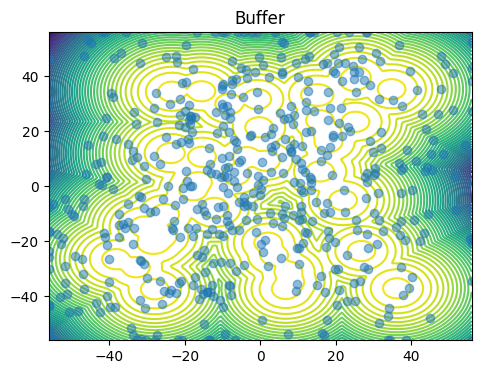

[<Figure size 1200x400 with 1 Axes>]

In [538]:
plot_dataset(x1_samples)

In [333]:
# ve_reverse_sde = VEReverseSDE(true_grad_Rt, beta)
noise_schedule = LinearNoiseSchedule(torch.tensor(500), 50 ** 2)
#noise_schedule = GeometricNoiseSchedule(torch.tensor(0.01), torch.tensor(500), 50 ** 2)

In [175]:
ve_reverse_sde = VEReverseSDE(estimate_grad_Rt, noise_schedule)
# samples = generate_samples(ve_reverse_sde, x1_s'amples_normalized)
samples, pred_vectors = integrate_sde(ve_reverse_sde, x1_samples_normalized, [0, 1.0], 0.001) #true_vectors

In [549]:
import scipy.integrate as integrate

t = 0.8
print(integrate.quad(lambda x: noise_schedule.g(x).pow(2), 0.0, t)[0] ** 0.5)
print(noise_schedule.h(t))

0.022973966269791268
tensor(0.0005)


In [550]:
noise_schedule.h(0.5)

tensor(7.9998e-07)

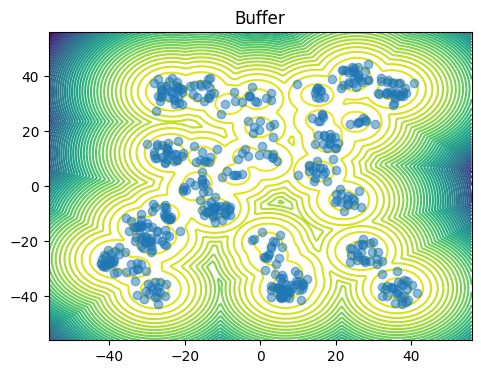

[<Figure size 1200x400 with 1 Axes>]

In [176]:
plot_dataset(unnormalize(samples[-1], global_mins_init, global_maxs_init))

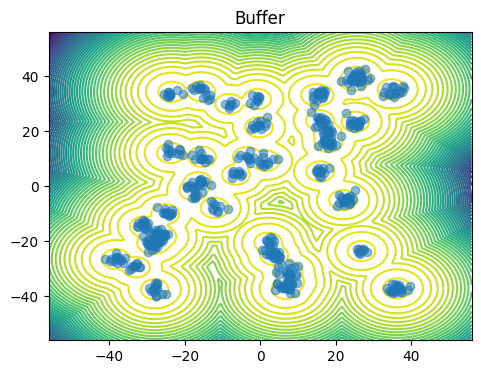

[<Figure size 1200x400 with 1 Axes>]

In [174]:
target.convolve(noise_schedule.h(0.01) * 50 * 50, 1)
v = target.sample((512,))
target.reset()
plot_dataset(v)

In [ ]:
plot_dataset(unnormalize(true_samples[-1], global_mins_init, global_maxs_init))

In [ ]:
plot_dataset(unnormalize(model_samples[-1], global_mins_init, global_maxs_init))

In [ ]:
unnormalized_samples = unnormalize(samples, global_mins_init, global_maxs_init)

plt.plot(torch.arange(0, 1.0, 0.001), unnormalized_samples[:, 105:110, 0].detach().cpu())
plt.xlabel('time')
plt.show()

In [ ]:
unnormalized_samples = unnormalize(model_samples, global_mins_init, global_maxs_init)

plt.plot(torch.arange(0, 1.0, 0.001), unnormalized_samples[:, 105:110, 0].detach().cpu())
plt.xlabel('time')
plt.show()

In [528]:
ve_reverse_sde = VEReverseSDE(true_grad_Rt, noise_schedule)
# samples = generate_samples(ve_reverse_sde, x1_samples_normalized)
true_samples, true_vectors = integrate_sde(ve_reverse_sde, x1_samples_normalized, [0, 0.999], 0.001) #true_vectors

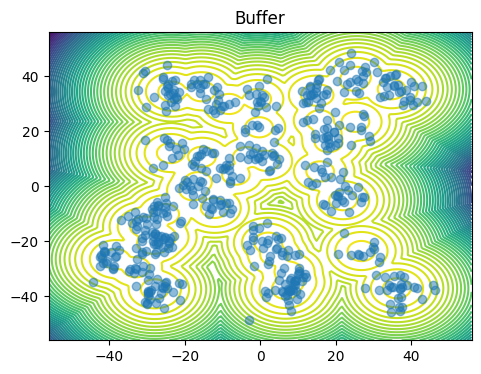

[<Figure size 1200x400 with 1 Axes>]

In [529]:
plot_dataset(unnormalize(true_samples[-1], global_mins_init, global_maxs_init))

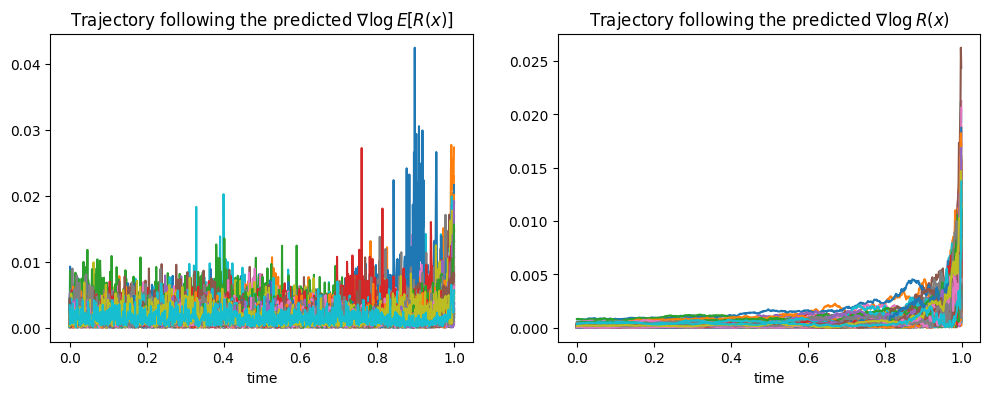

In [26]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
# predicted 
traj_pred = torch.cumsum(pred_vectors, dim=-1)
axs[0].plot(torch.arange(0, 1, 0.001), torch.linalg.norm(traj_pred[:,:200], dim=-1).cpu())
axs[0].set_xlabel("time")
axs[0].set_title(r"Trajectory following the predicted $\nabla \log E[R(x)]$")


# true
traj_true = torch.cumsum(true_vectors, dim=-1)
axs[1].plot(torch.arange(0, 1, 0.001), torch.linalg.norm(traj_true[:,:200], dim=-1).cpu())
axs[1].set_xlabel("time")
axs[1].set_title(r"Trajectory following the predicted $\nabla \log R(x)$")

plt.show()

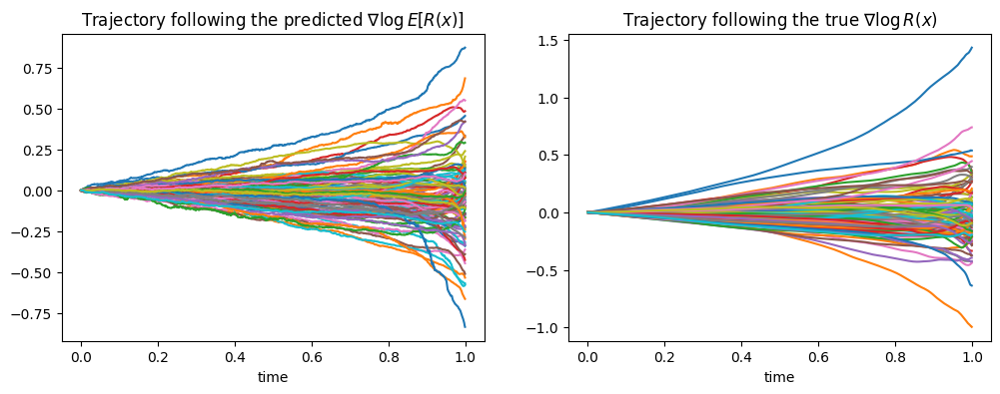

In [27]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# predicted 
# plt.plot(torch.arange(0, 1, 0.001), torch.cumsum(traj_norm_pred, dim=0).cpu())
axs[0].plot(torch.arange(0, 1, 0.001)[:], torch.cumsum(pred_vectors[:, :100, 0], dim=0).cpu())
axs[0].set_xlabel("time")
axs[0].set_title(r"Trajectory following the predicted $\nabla \log E[R(x)]$")


# true
# plt.plot(torch.arange(0, 1, 0.001), torch.cumsum(traj_norm_true, dim=0).cpu())
axs[1].plot(torch.arange(0, 1, 0.001), torch.cumsum(true_vectors[:, :100, 0], dim=0).cpu())
axs[1].set_xlabel("time")
axs[1].set_title(r"Trajectory following the true $\nabla \log R(x)$")

plt.show()

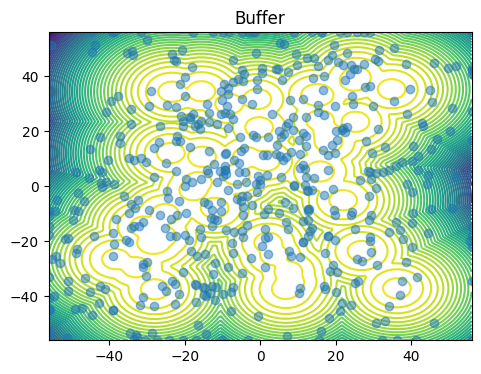

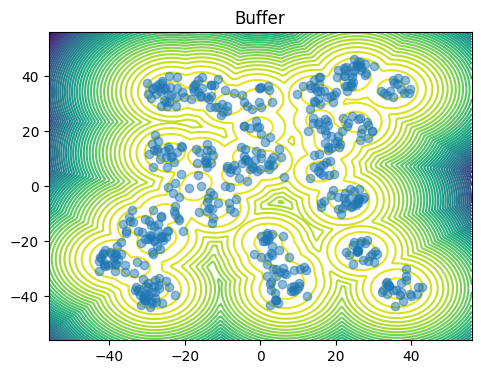

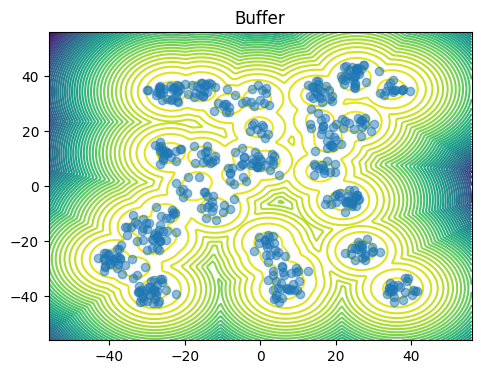

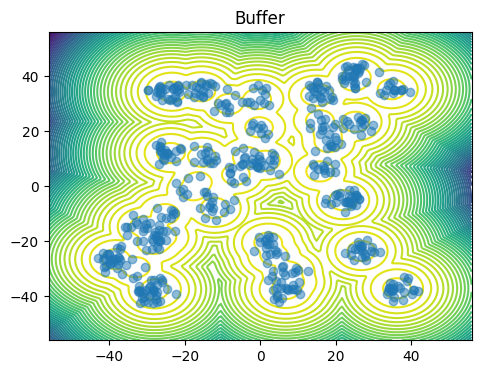

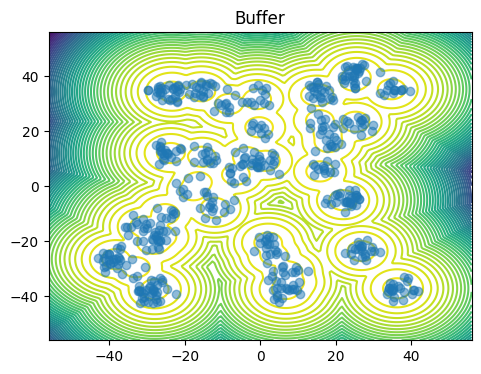

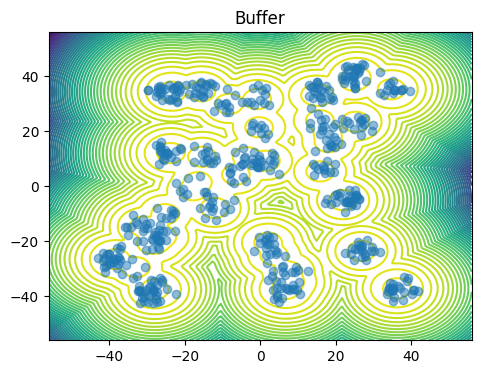

In [553]:
for i in range(0, samples.shape[0], 199):
    plot_dataset(unnormalize(samples[i], global_mins_init, global_maxs_init))

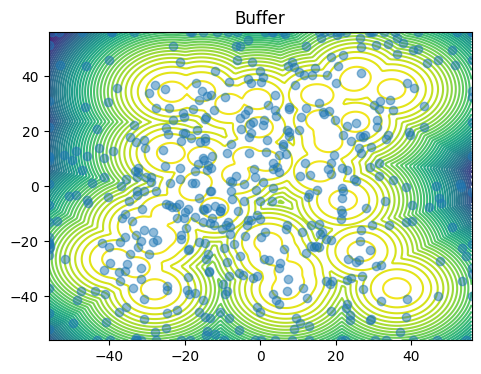

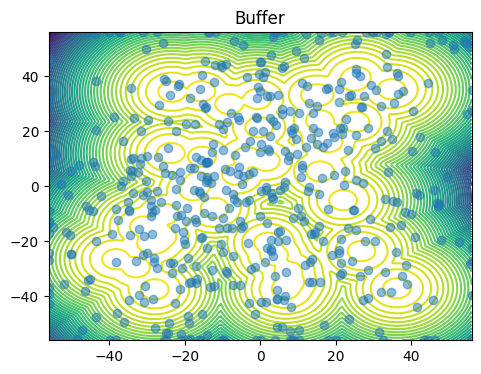

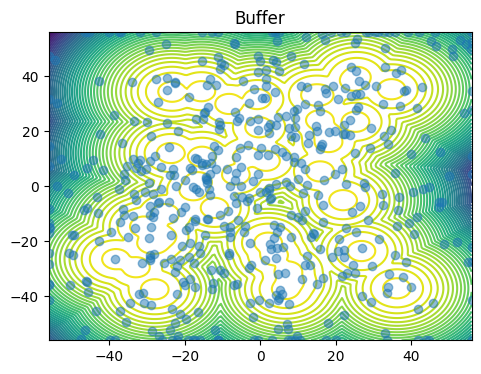

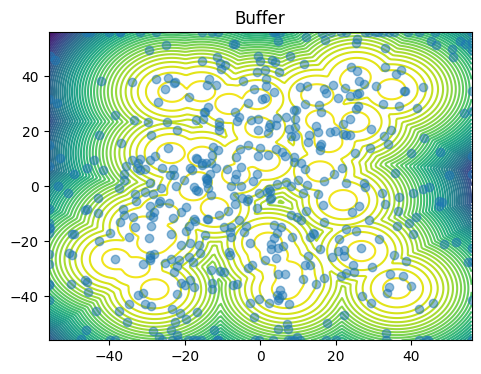

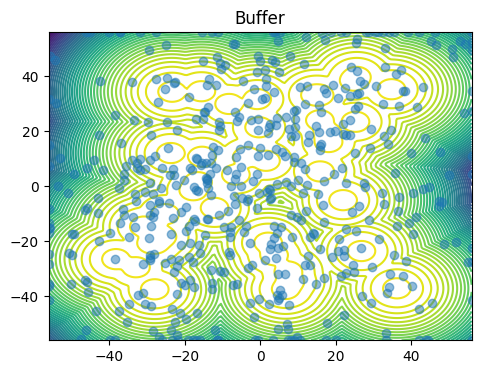

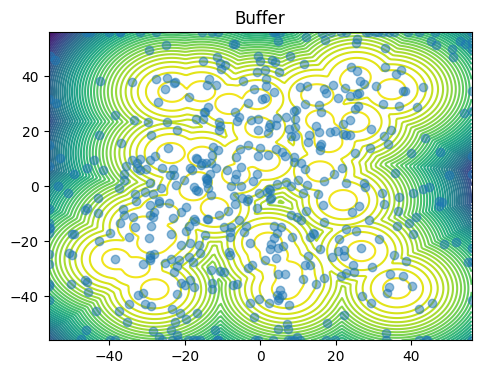

In [440]:
for i in range(0, true_samples.shape[0], 199):
    plot_dataset(unnormalize(true_samples[i], global_mins_init, global_maxs_init))

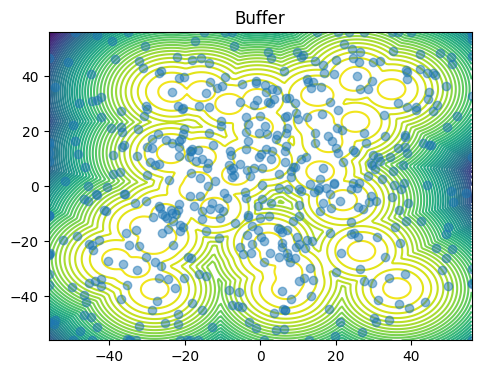

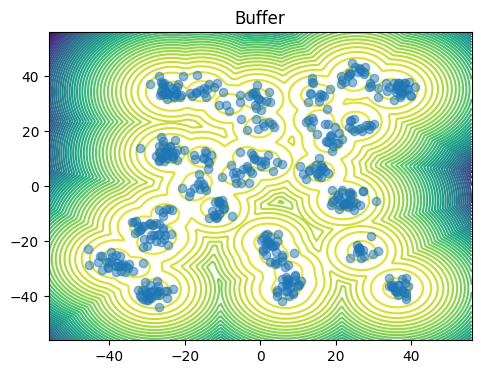

[<Figure size 1200x400 with 1 Axes>]

In [177]:
plot_dataset(unnormalize(true_samples[0], global_mins_init, global_maxs_init))
plot_dataset(unnormalize(true_samples[30], global_mins_init, global_maxs_init))

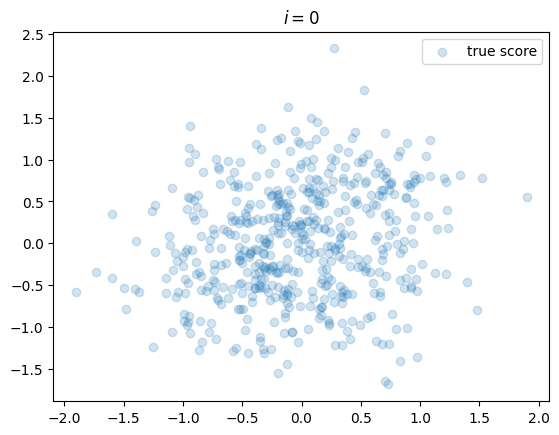

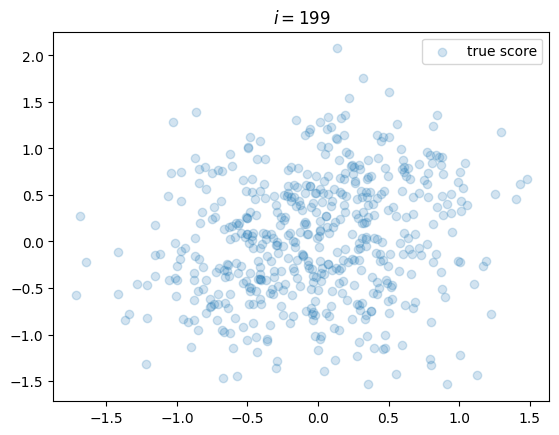

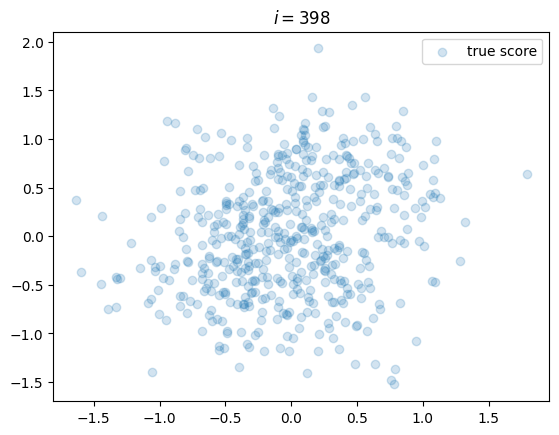

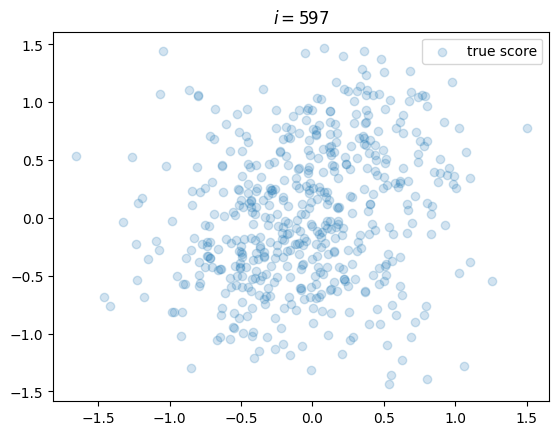

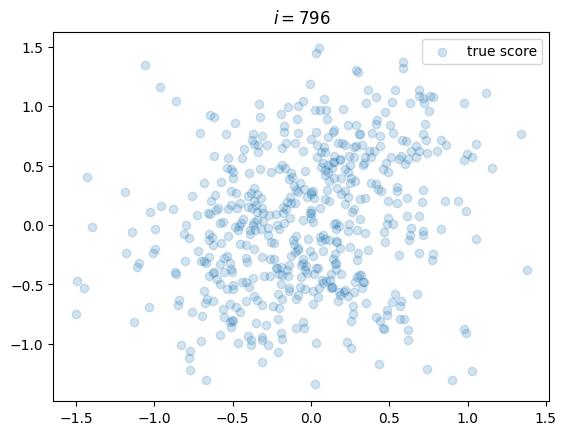

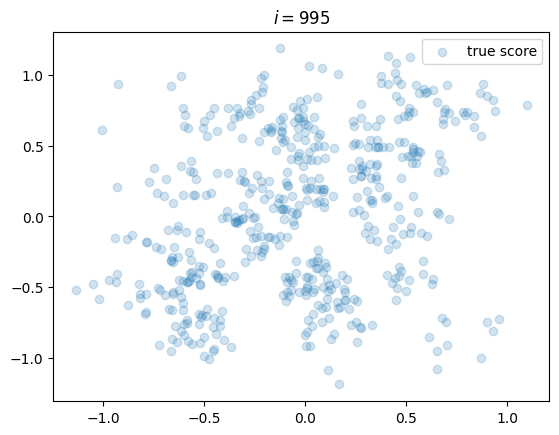

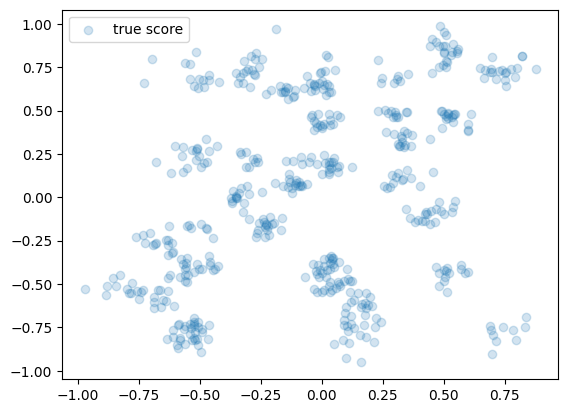

In [161]:
for i in range(0, model_samples.shape[0], 199):
    #plt.scatter(*model_samples[i].T.detach().cpu(), alpha=0.2, label='model')
    plt.scatter(*true_samples[i].T.detach().cpu(), alpha=0.2, label='true score')
    #plt.scatter(*samples[i].T.detach().cpu(), alpha=0.2, label='estimated score')
    plt.legend()
    plt.title(r'$i=%d$' % i)

    #plot_dataset(unnormalize(model_samples[i], global_mins_init, global_maxs_init))
    plt.show()
    
plt.scatter(*true_samples[-1].T.detach().cpu(), alpha=0.2, label='true score')
plt.legend()
plt.show()

ValueError: tensor([0.0000, 0.0010, 0.0020, 0.0030, 0.0040, 0.0050, 0.0060, 0.0070, 0.0080,
        0.0090, 0.0100, 0.0110, 0.0120, 0.0130, 0.0140, 0.0150, 0.0160, 0.0170,
        0.0180, 0.0190, 0.0200, 0.0210, 0.0220, 0.0230, 0.0240, 0.0250, 0.0260,
        0.0270, 0.0280, 0.0290, 0.0300, 0.0310, 0.0320, 0.0330, 0.0340, 0.0350,
        0.0360, 0.0370, 0.0380, 0.0390, 0.0400, 0.0410, 0.0420, 0.0430, 0.0440,
        0.0450, 0.0460, 0.0470, 0.0480, 0.0490, 0.0501, 0.0511, 0.0521, 0.0531,
        0.0541, 0.0551, 0.0561, 0.0571, 0.0581, 0.0591, 0.0601, 0.0611, 0.0621,
        0.0631, 0.0641, 0.0651, 0.0661, 0.0671, 0.0681, 0.0691, 0.0701, 0.0711,
        0.0721, 0.0731, 0.0741, 0.0751, 0.0761, 0.0771, 0.0781, 0.0791, 0.0801,
        0.0811, 0.0821, 0.0831, 0.0841, 0.0851, 0.0861, 0.0871, 0.0881, 0.0891,
        0.0901, 0.0911, 0.0921, 0.0931, 0.0941, 0.0951, 0.0961, 0.0971, 0.0981,
        0.0991, 0.1001, 0.1011, 0.1021, 0.1031, 0.1041, 0.1051, 0.1061, 0.1071,
        0.1081, 0.1091, 0.1101, 0.1111, 0.1121, 0.1131, 0.1141, 0.1151, 0.1161,
        0.1171, 0.1181, 0.1191, 0.1201, 0.1211, 0.1221, 0.1231, 0.1241, 0.1251,
        0.1261, 0.1271, 0.1281, 0.1291, 0.1301, 0.1311, 0.1321, 0.1331, 0.1341,
        0.1351, 0.1361, 0.1371, 0.1381, 0.1391, 0.1401, 0.1411, 0.1421, 0.1431,
        0.1441, 0.1451, 0.1461, 0.1471, 0.1481, 0.1491, 0.1502, 0.1512, 0.1522,
        0.1532, 0.1542, 0.1552, 0.1562, 0.1572, 0.1582, 0.1592, 0.1602, 0.1612,
        0.1622, 0.1632, 0.1642, 0.1652, 0.1662, 0.1672, 0.1682, 0.1692, 0.1702,
        0.1712, 0.1722, 0.1732, 0.1742, 0.1752, 0.1762, 0.1772, 0.1782, 0.1792,
        0.1802, 0.1812, 0.1822, 0.1832, 0.1842, 0.1852, 0.1862, 0.1872, 0.1882,
        0.1892, 0.1902, 0.1912, 0.1922, 0.1932, 0.1942, 0.1952, 0.1962, 0.1972,
        0.1982, 0.1992, 0.2002, 0.2012, 0.2022, 0.2032, 0.2042, 0.2052, 0.2062,
        0.2072, 0.2082, 0.2092, 0.2102, 0.2112, 0.2122, 0.2132, 0.2142, 0.2152,
        0.2162, 0.2172, 0.2182, 0.2192, 0.2202, 0.2212, 0.2222, 0.2232, 0.2242,
        0.2252, 0.2262, 0.2272, 0.2282, 0.2292, 0.2302, 0.2312, 0.2322, 0.2332,
        0.2342, 0.2352, 0.2362, 0.2372, 0.2382, 0.2392, 0.2402, 0.2412, 0.2422,
        0.2432, 0.2442, 0.2452, 0.2462, 0.2472, 0.2482, 0.2492, 0.2503, 0.2513,
        0.2523, 0.2533, 0.2543, 0.2553, 0.2563, 0.2573, 0.2583, 0.2593, 0.2603,
        0.2613, 0.2623, 0.2633, 0.2643, 0.2653, 0.2663, 0.2673, 0.2683, 0.2693,
        0.2703, 0.2713, 0.2723, 0.2733, 0.2743, 0.2753, 0.2763, 0.2773, 0.2783,
        0.2793, 0.2803, 0.2813, 0.2823, 0.2833, 0.2843, 0.2853, 0.2863, 0.2873,
        0.2883, 0.2893, 0.2903, 0.2913, 0.2923, 0.2933, 0.2943, 0.2953, 0.2963,
        0.2973, 0.2983, 0.2993, 0.3003, 0.3013, 0.3023, 0.3033, 0.3043, 0.3053,
        0.3063, 0.3073, 0.3083, 0.3093, 0.3103, 0.3113, 0.3123, 0.3133, 0.3143,
        0.3153, 0.3163, 0.3173, 0.3183, 0.3193, 0.3203, 0.3213, 0.3223, 0.3233,
        0.3243, 0.3253, 0.3263, 0.3273, 0.3283, 0.3293, 0.3303, 0.3313, 0.3323,
        0.3333, 0.3343, 0.3353, 0.3363, 0.3373, 0.3383, 0.3393, 0.3403, 0.3413,
        0.3423, 0.3433, 0.3443, 0.3453, 0.3463, 0.3473, 0.3483, 0.3493, 0.3504,
        0.3514, 0.3524, 0.3534, 0.3544, 0.3554, 0.3564, 0.3574, 0.3584, 0.3594,
        0.3604, 0.3614, 0.3624, 0.3634, 0.3644, 0.3654, 0.3664, 0.3674, 0.3684,
        0.3694, 0.3704, 0.3714, 0.3724, 0.3734, 0.3744, 0.3754, 0.3764, 0.3774,
        0.3784, 0.3794, 0.3804, 0.3814, 0.3824, 0.3834, 0.3844, 0.3854, 0.3864,
        0.3874, 0.3884, 0.3894, 0.3904, 0.3914, 0.3924, 0.3934, 0.3944, 0.3954,
        0.3964, 0.3974, 0.3984, 0.3994, 0.4004, 0.4014, 0.4024, 0.4034, 0.4044,
        0.4054, 0.4064, 0.4074, 0.4084, 0.4094, 0.4104, 0.4114, 0.4124, 0.4134,
        0.4144, 0.4154, 0.4164, 0.4174, 0.4184, 0.4194, 0.4204, 0.4214, 0.4224,
        0.4234, 0.4244, 0.4254, 0.4264, 0.4274, 0.4284, 0.4294, 0.4304, 0.4314,
        0.4324, 0.4334, 0.4344, 0.4354, 0.4364, 0.4374, 0.4384, 0.4394, 0.4404,
        0.4414, 0.4424, 0.4434, 0.4444, 0.4454, 0.4464, 0.4474, 0.4484, 0.4494,
        0.4505, 0.4515, 0.4525, 0.4535, 0.4545, 0.4555, 0.4565, 0.4575, 0.4585,
        0.4595, 0.4605, 0.4615, 0.4625, 0.4635, 0.4645, 0.4655, 0.4665, 0.4675,
        0.4685, 0.4695, 0.4705, 0.4715, 0.4725, 0.4735, 0.4745, 0.4755, 0.4765,
        0.4775, 0.4785, 0.4795, 0.4805, 0.4815, 0.4825, 0.4835, 0.4845, 0.4855,
        0.4865, 0.4875, 0.4885, 0.4895, 0.4905, 0.4915, 0.4925, 0.4935, 0.4945,
        0.4955, 0.4965, 0.4975, 0.4985, 0.4995, 0.5005, 0.5015, 0.5025, 0.5035,
        0.5045, 0.5055, 0.5065, 0.5075, 0.5085, 0.5095, 0.5105, 0.5115, 0.5125,
        0.5135, 0.5145, 0.5155, 0.5165, 0.5175, 0.5185, 0.5195, 0.5205, 0.5215,
        0.5225, 0.5235, 0.5245, 0.5255, 0.5265, 0.5275, 0.5285, 0.5295, 0.5305,
        0.5315, 0.5325, 0.5335, 0.5345, 0.5355, 0.5365, 0.5375, 0.5385, 0.5395,
        0.5405, 0.5415, 0.5425, 0.5435, 0.5445, 0.5455, 0.5465, 0.5475, 0.5485,
        0.5495, 0.5506, 0.5516, 0.5526, 0.5536, 0.5546, 0.5556, 0.5566, 0.5576,
        0.5586, 0.5596, 0.5606, 0.5616, 0.5626, 0.5636, 0.5646, 0.5656, 0.5666,
        0.5676, 0.5686, 0.5696, 0.5706, 0.5716, 0.5726, 0.5736, 0.5746, 0.5756,
        0.5766, 0.5776, 0.5786, 0.5796, 0.5806, 0.5816, 0.5826, 0.5836, 0.5846,
        0.5856, 0.5866, 0.5876, 0.5886, 0.5896, 0.5906, 0.5916, 0.5926, 0.5936,
        0.5946, 0.5956, 0.5966, 0.5976, 0.5986, 0.5996, 0.6006, 0.6016, 0.6026,
        0.6036, 0.6046, 0.6056, 0.6066, 0.6076, 0.6086, 0.6096, 0.6106, 0.6116,
        0.6126, 0.6136, 0.6146, 0.6156, 0.6166, 0.6176, 0.6186, 0.6196, 0.6206,
        0.6216, 0.6226, 0.6236, 0.6246, 0.6256, 0.6266, 0.6276, 0.6286, 0.6296,
        0.6306, 0.6316, 0.6326, 0.6336, 0.6346, 0.6356, 0.6366, 0.6376, 0.6386,
        0.6396, 0.6406, 0.6416, 0.6426, 0.6436, 0.6446, 0.6456, 0.6466, 0.6476,
        0.6486, 0.6496, 0.6507, 0.6517, 0.6527, 0.6537, 0.6547, 0.6557, 0.6567,
        0.6577, 0.6587, 0.6597, 0.6607, 0.6617, 0.6627, 0.6637, 0.6647, 0.6657,
        0.6667, 0.6677, 0.6687, 0.6697, 0.6707, 0.6717, 0.6727, 0.6737, 0.6747,
        0.6757, 0.6767, 0.6777, 0.6787, 0.6797, 0.6807, 0.6817, 0.6827, 0.6837,
        0.6847, 0.6857, 0.6867, 0.6877, 0.6887, 0.6897, 0.6907, 0.6917, 0.6927,
        0.6937, 0.6947, 0.6957, 0.6967, 0.6977, 0.6987, 0.6997, 0.7007, 0.7017,
        0.7027, 0.7037, 0.7047, 0.7057, 0.7067, 0.7077, 0.7087, 0.7097, 0.7107,
        0.7117, 0.7127, 0.7137, 0.7147, 0.7157, 0.7167, 0.7177, 0.7187, 0.7197,
        0.7207, 0.7217, 0.7227, 0.7237, 0.7247, 0.7257, 0.7267, 0.7277, 0.7287,
        0.7297, 0.7307, 0.7317, 0.7327, 0.7337, 0.7347, 0.7357, 0.7367, 0.7377,
        0.7387, 0.7397, 0.7407, 0.7417, 0.7427, 0.7437, 0.7447, 0.7457, 0.7467,
        0.7477, 0.7487, 0.7497, 0.7508, 0.7518, 0.7528, 0.7538, 0.7548, 0.7558,
        0.7568, 0.7578, 0.7588, 0.7598, 0.7608, 0.7618, 0.7628, 0.7638, 0.7648,
        0.7658, 0.7668, 0.7678, 0.7688, 0.7698, 0.7708, 0.7718, 0.7728, 0.7738,
        0.7748, 0.7758, 0.7768, 0.7778, 0.7788, 0.7798, 0.7808, 0.7818, 0.7828,
        0.7838, 0.7848, 0.7858, 0.7868, 0.7878, 0.7888, 0.7898, 0.7908, 0.7918,
        0.7928, 0.7938, 0.7948, 0.7958, 0.7968, 0.7978, 0.7988, 0.7998, 0.8008,
        0.8018, 0.8028, 0.8038, 0.8048, 0.8058, 0.8068, 0.8078, 0.8088, 0.8098,
        0.8108, 0.8118, 0.8128, 0.8138, 0.8148, 0.8158, 0.8168, 0.8178, 0.8188,
        0.8198, 0.8208, 0.8218, 0.8228, 0.8238, 0.8248, 0.8258, 0.8268, 0.8278,
        0.8288, 0.8298, 0.8308, 0.8318, 0.8328, 0.8338, 0.8348, 0.8358, 0.8368,
        0.8378, 0.8388, 0.8398, 0.8408, 0.8418, 0.8428, 0.8438, 0.8448, 0.8458,
        0.8468, 0.8478, 0.8488, 0.8498, 0.8509, 0.8519, 0.8529, 0.8539, 0.8549,
        0.8559, 0.8569, 0.8579, 0.8589, 0.8599, 0.8609, 0.8619, 0.8629, 0.8639,
        0.8649, 0.8659, 0.8669, 0.8679, 0.8689, 0.8699, 0.8709, 0.8719, 0.8729,
        0.8739, 0.8749, 0.8759, 0.8769, 0.8779, 0.8789, 0.8799, 0.8809, 0.8819,
        0.8829, 0.8839, 0.8849, 0.8859, 0.8869, 0.8879, 0.8889, 0.8899, 0.8909,
        0.8919, 0.8929, 0.8939, 0.8949, 0.8959, 0.8969, 0.8979, 0.8989, 0.8999,
        0.9009, 0.9019, 0.9029, 0.9039, 0.9049, 0.9059, 0.9069, 0.9079, 0.9089,
        0.9099, 0.9109, 0.9119, 0.9129, 0.9139, 0.9149, 0.9159, 0.9169, 0.9179,
        0.9189, 0.9199, 0.9209, 0.9219, 0.9229, 0.9239, 0.9249, 0.9259, 0.9269,
        0.9279, 0.9289, 0.9299, 0.9309, 0.9319, 0.9329, 0.9339, 0.9349, 0.9359,
        0.9369, 0.9379, 0.9389, 0.9399, 0.9409, 0.9419, 0.9429, 0.9439, 0.9449,
        0.9459, 0.9469, 0.9479, 0.9489, 0.9499, 0.9510, 0.9520, 0.9530, 0.9540,
        0.9550, 0.9560, 0.9570, 0.9580, 0.9590, 0.9600, 0.9610, 0.9620, 0.9630,
        0.9640, 0.9650, 0.9660, 0.9670, 0.9680, 0.9690, 0.9700, 0.9710, 0.9720,
        0.9730, 0.9740, 0.9750, 0.9760, 0.9770, 0.9780, 0.9790, 0.9800, 0.9810,
        0.9820, 0.9830, 0.9840, 0.9850, 0.9860, 0.9870, 0.9880, 0.9890, 0.9900,
        0.9910, 0.9920, 0.9930, 0.9940, 0.9950, 0.9960, 0.9970, 0.9980, 0.9990,
        1.0000]) is not a valid value for color

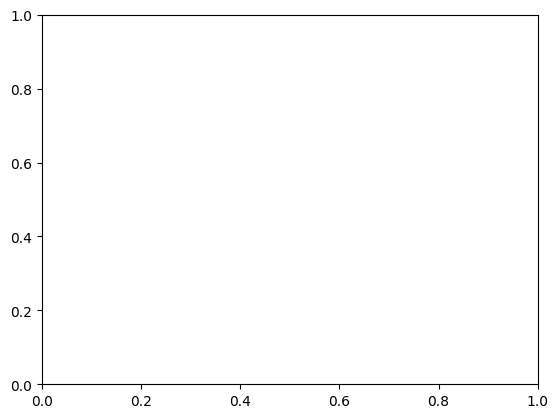

In [109]:
plt.plot(model_samples[:, 0, 0].detach().cpu(), model_samples[:,0,1].detach().cpu(), c=torch.linspace(0, 1, len(model_samples)))

### Training

In [450]:
def reward_matching_loss_biased(vectorfield, x, t, noise_schedule): 
    h_t = noise_schedule.h(t)
    #h_t = beta * t.unsqueeze(1)
    x.requires_grad = True

    # noisy sample: x(t)
    noisy_x = torch.normal(x, h_t.unsqueeze(1) ** 0.5)
    pred_scores = vectorfield(noisy_x, t)

    #estimated_scores = estimate_grad_Rt(noisy_x, t, noise_schedule) * (h_t + 5e-3).unsqueeze(1)
    estimated_scores = true_grad_Rt(x, t, noise_schedule) * (h_t + 5e-3).unsqueeze(1)
    #norm = torch.linalg.vector_norm(estimated_scores, dim=-1)
    #print(norm.max())
    #max_norm = 100
    #clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
    #estimated_scores = estimated_scores * clip_coef.unsqueeze(-1)
    

    return ((estimated_scores - pred_scores)**2) / ((h_t + 1e-3).unsqueeze(1))

In [470]:
def score_loss(vectorfield, x, t):
    h_t = beta * t.unsqueeze(1)
    # x(t)
    x_t = torch.normal(x, h_t ** 0.5)
    s_pred = vectorfield(x_t, t)

    s_true = - (x_t - x)/ h_t 
    return ((s_pred - s_true)**2) / ((h_t + 1e-2))#.mean()    

In [430]:
import torch.distributions as dist
class LogUniform(dist.TransformedDistribution):
    def __init__(self, lb, ub):
        super(LogUniform, self).__init__(dist.Uniform(lb.log(), ub.log()),
                                         dist.ExpTransform())

In [471]:
beta = 0.2
vectorfield = MyMLP(add_t_emb=False, concat_t_emb=True).to(device)

In [472]:
#vectorfield.load_state_dict(torch.load('/mnt/user_storage/long_trained_reward_matching_gmm.pt'))

In [473]:
opt_vectorfield = Adam(vectorfield.parameters(), lr=1e-4)

In [474]:
# buffer = SimpleBuffer(2, 10000, 1000, initial_sampler=None, 
#                       device=device, fill_buffer_during_init=False, sample_with_replacement=True)
buffer = SimpleBuffer(2, 10000, 1000, initial_sampler=None, 
                      device=device, fill_buffer_during_init=False, 
                      sample_with_replacement=True, prioritize=True)

# x1_energy = target.log_prob(x1_samples).detach()
# buffer.add(x1_samples_normalized, x1_energy)
buffer.add(init_samples, init_energy)

Buffer not initialised, expected that checkpoint will be loaded.


In [475]:
outer_epochs= 10000
inner_epochs = 10

num_samples = 2048 

#train_dataset = TensorDataset(x1_samples_normalized.clone(), x1_energy.clone())
train_dataset = TensorDataset(init_samples.clone(), init_energy.clone())
trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True) 
global_mins, global_maxs = global_mins_init, global_maxs_init

In [476]:
init_num_samples = 2048
unnorm_true_samples = (
    target.sample(torch.tensor(init_num_samples).unsqueeze(0)).to(device).detach()
)
unnorm_init_samples = flow.sample((init_num_samples,)).to(device).detach()
init_energy = target.log_prob(unnorm_init_samples).detach()
init_samples, global_mins_init, global_maxs_init = normalize(unnorm_true_samples)

global_mins_init = -50
global_maxs_init = 50

init_dataset = TensorDataset(init_samples, init_energy)
init_loader = DataLoader(init_dataset, batch_size=512, shuffle=True)

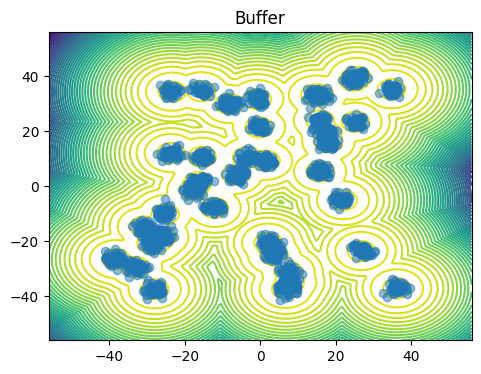

[<Figure size 1200x400 with 1 Axes>]

In [477]:
plot_dataset(unnormalize(init_samples, global_mins, global_maxs))

  0%|          | 0/10000 [00:00<?, ?it/s]

Epoch 0 | Loss 1139.466064


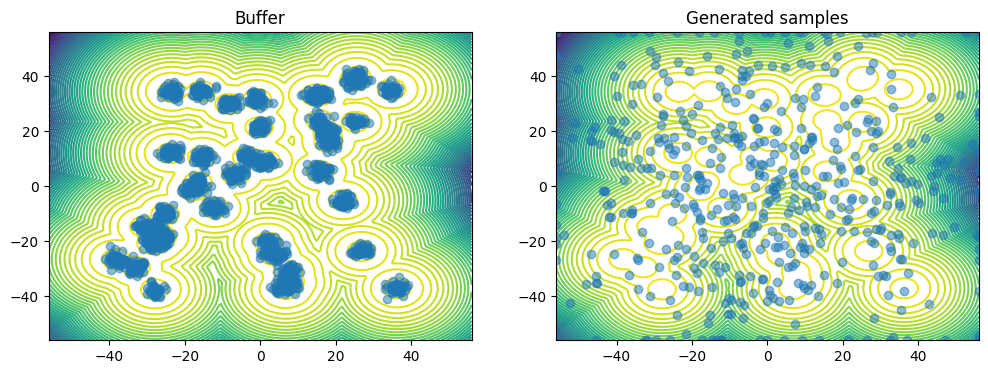

  0%|          | 1/10000 [00:03<10:03:13,  3.62s/it]

Epoch 0 | Loss 1372.604492


  0%|          | 2/10000 [00:04<5:26:02,  1.96s/it] 

Epoch 0 | Loss 2818.644287


  0%|          | 3/10000 [00:04<3:31:13,  1.27s/it]

Epoch 0 | Loss 1161.653076


  0%|          | 4/10000 [00:05<2:37:38,  1.06it/s]

Epoch 0 | Loss 2263.702637


  0%|          | 5/10000 [00:05<2:07:28,  1.31it/s]

Epoch 0 | Loss 1539.353760


  0%|          | 6/10000 [00:06<1:49:12,  1.53it/s]

Epoch 0 | Loss 2824.325684


  0%|          | 7/10000 [00:06<1:37:28,  1.71it/s]

Epoch 0 | Loss 1329.870361


  0%|          | 8/10000 [00:07<1:29:59,  1.85it/s]

Epoch 0 | Loss 1804.444824


  0%|          | 9/10000 [00:07<1:25:27,  1.95it/s]

Epoch 0 | Loss 3947.445557


  0%|          | 10/10000 [00:07<1:22:00,  2.03it/s]

Epoch 0 | Loss 1575.963379


  0%|          | 11/10000 [00:08<1:19:38,  2.09it/s]

Epoch 0 | Loss 1260.811646


  0%|          | 12/10000 [00:08<1:18:10,  2.13it/s]

Epoch 0 | Loss 2610.562500


  0%|          | 13/10000 [00:09<1:16:55,  2.16it/s]

Epoch 0 | Loss 2859.851074


  0%|          | 14/10000 [00:09<1:16:11,  2.18it/s]

Epoch 0 | Loss 1104.316895


  0%|          | 15/10000 [00:10<1:15:33,  2.20it/s]

Epoch 0 | Loss 811.946716


  0%|          | 16/10000 [00:10<1:14:57,  2.22it/s]

Epoch 0 | Loss 1328.004150


  0%|          | 17/10000 [00:11<1:14:37,  2.23it/s]

Epoch 0 | Loss 2190.613281


  0%|          | 18/10000 [00:11<1:14:17,  2.24it/s]

Epoch 0 | Loss 2391.695557


  0%|          | 19/10000 [00:11<1:14:04,  2.25it/s]

Epoch 0 | Loss 5314.428711


  0%|          | 20/10000 [00:12<1:14:07,  2.24it/s]

Epoch 0 | Loss 3517.904297


  0%|          | 21/10000 [00:12<1:13:58,  2.25it/s]

Epoch 0 | Loss 2203.282471


  0%|          | 22/10000 [00:13<1:14:02,  2.25it/s]

Epoch 0 | Loss 4451.545898


  0%|          | 23/10000 [00:13<1:13:52,  2.25it/s]

Epoch 0 | Loss 2497.102295


  0%|          | 24/10000 [00:14<1:13:45,  2.25it/s]

Epoch 0 | Loss 2997.576172


  0%|          | 25/10000 [00:14<1:30:36,  1.83it/s]

Epoch 0 | Loss 1072.146240


  0%|          | 26/10000 [00:15<1:25:24,  1.95it/s]

Epoch 0 | Loss 2279.246338


  0%|          | 27/10000 [00:15<1:21:49,  2.03it/s]

Epoch 0 | Loss 2754.759277


  0%|          | 28/10000 [00:16<1:19:21,  2.09it/s]

Epoch 0 | Loss 1263.879883


  0%|          | 29/10000 [00:16<1:17:34,  2.14it/s]

Epoch 0 | Loss 1909.320068


  0%|          | 30/10000 [00:17<1:16:28,  2.17it/s]

Epoch 0 | Loss 1493.828613


  0%|          | 31/10000 [00:17<1:16:10,  2.18it/s]

Epoch 0 | Loss 3371.251953


  0%|          | 32/10000 [00:18<1:15:44,  2.19it/s]

Epoch 0 | Loss 931.253723


  0%|          | 33/10000 [00:18<1:15:21,  2.20it/s]

Epoch 0 | Loss 4884.760254


  0%|          | 34/10000 [00:19<1:15:05,  2.21it/s]

Epoch 0 | Loss 2358.263184


  0%|          | 35/10000 [00:19<1:14:50,  2.22it/s]

Epoch 0 | Loss 2157.892578


  0%|          | 36/10000 [00:19<1:14:57,  2.22it/s]

Epoch 0 | Loss 2899.701172


  0%|          | 37/10000 [00:20<1:15:15,  2.21it/s]

Epoch 0 | Loss 1197.653564


  0%|          | 38/10000 [00:20<1:15:27,  2.20it/s]

Epoch 0 | Loss 1408.577637


  0%|          | 39/10000 [00:21<1:14:57,  2.21it/s]

Epoch 0 | Loss 23961.476562


  0%|          | 40/10000 [00:21<1:14:40,  2.22it/s]

Epoch 0 | Loss 898.059570


  0%|          | 41/10000 [00:22<1:14:39,  2.22it/s]

Epoch 0 | Loss 4161.780273


  0%|          | 42/10000 [00:22<1:15:55,  2.19it/s]

Epoch 0 | Loss 789.582153


  0%|          | 43/10000 [00:23<1:15:32,  2.20it/s]

Epoch 0 | Loss 853.879089


  0%|          | 44/10000 [00:23<1:18:31,  2.11it/s]

Epoch 0 | Loss 5785.163574


  0%|          | 45/10000 [00:24<1:22:08,  2.02it/s]

Epoch 0 | Loss 3648.669434


  0%|          | 46/10000 [00:24<1:19:45,  2.08it/s]

Epoch 0 | Loss 1190.627197


  0%|          | 47/10000 [00:25<1:18:19,  2.12it/s]

Epoch 0 | Loss 1555.653564


  0%|          | 48/10000 [00:25<1:16:46,  2.16it/s]

Epoch 0 | Loss 1350.038696


  0%|          | 49/10000 [00:25<1:15:50,  2.19it/s]

Epoch 0 | Loss 1474.531250


  0%|          | 50/10000 [00:26<1:15:08,  2.21it/s]

Epoch 0 | Loss 2109.034180


  1%|          | 51/10000 [00:26<1:14:53,  2.21it/s]

Epoch 0 | Loss 3463.101074


  1%|          | 52/10000 [00:27<1:15:18,  2.20it/s]

Epoch 0 | Loss 5219.741699


  1%|          | 53/10000 [00:27<1:15:41,  2.19it/s]

Epoch 0 | Loss 1390.354980


  1%|          | 54/10000 [00:28<1:15:25,  2.20it/s]

Epoch 0 | Loss 5301.986328


  1%|          | 55/10000 [00:28<1:14:56,  2.21it/s]

Epoch 0 | Loss 1596.915039


  1%|          | 56/10000 [00:29<1:14:44,  2.22it/s]

Epoch 0 | Loss 1100.435791


  1%|          | 57/10000 [00:29<1:14:46,  2.22it/s]

Epoch 0 | Loss 4062.896973


  1%|          | 58/10000 [00:29<1:14:47,  2.22it/s]

Epoch 0 | Loss 2600.354248


  1%|          | 59/10000 [00:30<1:14:44,  2.22it/s]

Epoch 0 | Loss 5575.789062


  1%|          | 60/10000 [00:30<1:14:30,  2.22it/s]

Epoch 0 | Loss 1638.631592


  1%|          | 61/10000 [00:31<1:14:30,  2.22it/s]

Epoch 0 | Loss 5669.520996


  1%|          | 62/10000 [00:31<1:14:13,  2.23it/s]

Epoch 0 | Loss 1832.098877


  1%|          | 63/10000 [00:32<1:14:19,  2.23it/s]

Epoch 0 | Loss 1774.749023


  1%|          | 64/10000 [00:32<1:14:43,  2.22it/s]

Epoch 0 | Loss 906.791382


  1%|          | 65/10000 [00:33<1:14:41,  2.22it/s]

Epoch 0 | Loss 4603.043457


  1%|          | 66/10000 [00:33<1:14:47,  2.21it/s]

Epoch 0 | Loss 1298.165283


  1%|          | 67/10000 [00:34<1:14:39,  2.22it/s]

Epoch 0 | Loss 6393.046875


  1%|          | 68/10000 [00:34<1:14:47,  2.21it/s]

Epoch 0 | Loss 2052.968506


  1%|          | 69/10000 [00:34<1:14:50,  2.21it/s]

Epoch 0 | Loss 3187.185303


  1%|          | 70/10000 [00:35<1:32:16,  1.79it/s]

Epoch 0 | Loss 2886.699951


  1%|          | 71/10000 [00:36<1:26:52,  1.90it/s]

Epoch 0 | Loss 1631.805420


  1%|          | 72/10000 [00:36<1:22:54,  2.00it/s]

Epoch 0 | Loss 924.388794


  1%|          | 73/10000 [00:37<1:20:20,  2.06it/s]

Epoch 0 | Loss 1703.063477


  1%|          | 74/10000 [00:37<1:19:31,  2.08it/s]

Epoch 0 | Loss 23770.347656


  1%|          | 75/10000 [00:38<1:18:04,  2.12it/s]

Epoch 0 | Loss 887.704224


  1%|          | 76/10000 [00:38<1:16:56,  2.15it/s]

Epoch 0 | Loss 2525.213135


  1%|          | 77/10000 [00:38<1:16:06,  2.17it/s]

Epoch 0 | Loss 2251.130371


  1%|          | 78/10000 [00:39<1:15:29,  2.19it/s]

Epoch 0 | Loss 5569.937988


  1%|          | 79/10000 [00:39<1:15:22,  2.19it/s]

Epoch 0 | Loss 2205.706787


  1%|          | 80/10000 [00:40<1:15:12,  2.20it/s]

Epoch 0 | Loss 2657.495605


  1%|          | 81/10000 [00:40<1:14:57,  2.21it/s]

Epoch 0 | Loss 7441.721191


  1%|          | 82/10000 [00:41<1:14:49,  2.21it/s]

Epoch 0 | Loss 957.992249


  1%|          | 83/10000 [00:41<1:14:43,  2.21it/s]

Epoch 0 | Loss 5759.375488


  1%|          | 84/10000 [00:42<1:14:28,  2.22it/s]

Epoch 0 | Loss 10116.225586


  1%|          | 85/10000 [00:42<1:15:34,  2.19it/s]

Epoch 0 | Loss 3802.532715


  1%|          | 86/10000 [00:42<1:15:11,  2.20it/s]

Epoch 0 | Loss 27719.982422


  1%|          | 87/10000 [00:43<1:14:45,  2.21it/s]

Epoch 0 | Loss 1013.701843


  1%|          | 88/10000 [00:43<1:14:30,  2.22it/s]

Epoch 0 | Loss 22846.253906


  1%|          | 89/10000 [00:44<1:14:30,  2.22it/s]

Epoch 0 | Loss 7496.894531


  1%|          | 90/10000 [00:44<1:14:31,  2.22it/s]

Epoch 0 | Loss 957.589722


  1%|          | 91/10000 [00:45<1:14:28,  2.22it/s]

Epoch 0 | Loss 10014.384766


  1%|          | 92/10000 [00:45<1:14:18,  2.22it/s]

Epoch 0 | Loss 5650.823242


  1%|          | 93/10000 [00:46<1:14:16,  2.22it/s]

Epoch 0 | Loss 24228.425781


  1%|          | 94/10000 [00:46<1:14:02,  2.23it/s]

Epoch 0 | Loss 3401.577637


  1%|          | 95/10000 [00:47<1:32:01,  1.79it/s]

Epoch 0 | Loss 2560.057617


  1%|          | 96/10000 [00:47<1:26:43,  1.90it/s]

Epoch 0 | Loss 1356.395996


  1%|          | 97/10000 [00:48<1:23:15,  1.98it/s]

Epoch 0 | Loss 1427.814209


  1%|          | 98/10000 [00:48<1:21:00,  2.04it/s]

Epoch 0 | Loss 2441.203125


  1%|          | 99/10000 [00:49<1:19:40,  2.07it/s]

Epoch 0 | Loss 1342.713867


  1%|          | 100/10000 [00:49<1:18:14,  2.11it/s]

Epoch 0 | Loss 995.659851


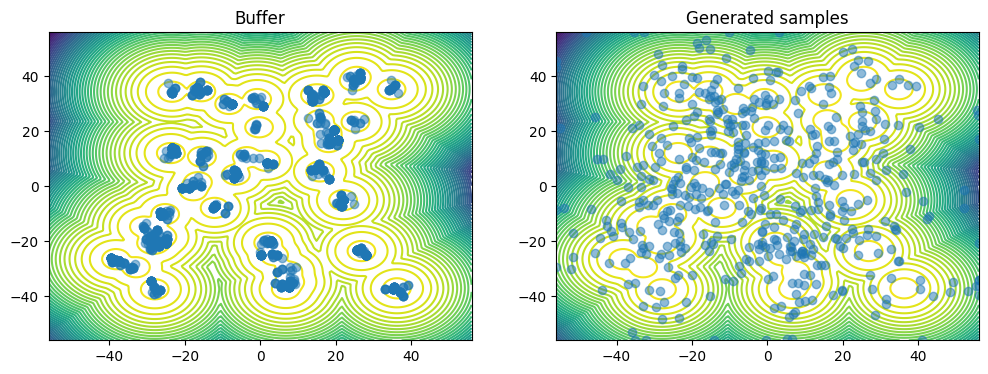

  1%|          | 101/10000 [00:53<3:56:19,  1.43s/it]

Epoch 0 | Loss 26292.947266


  1%|          | 102/10000 [00:53<3:09:10,  1.15s/it]

Epoch 0 | Loss 1508.533936


  1%|          | 103/10000 [00:54<2:35:17,  1.06it/s]

Epoch 0 | Loss 4368.421875


  1%|          | 104/10000 [00:54<2:11:39,  1.25it/s]

Epoch 0 | Loss 1983.233643


  1%|          | 105/10000 [00:55<1:55:17,  1.43it/s]

Epoch 0 | Loss 1108.259399


  1%|          | 106/10000 [00:55<1:43:26,  1.59it/s]

Epoch 0 | Loss 1341.547607


  1%|          | 107/10000 [00:56<1:34:34,  1.74it/s]

Epoch 0 | Loss 3872.541748


  1%|          | 108/10000 [00:56<1:28:14,  1.87it/s]

Epoch 0 | Loss 1394.637939


  1%|          | 109/10000 [00:57<1:23:44,  1.97it/s]

Epoch 0 | Loss 2290.203613


  1%|          | 110/10000 [00:57<1:21:51,  2.01it/s]

Epoch 0 | Loss 1334.454834


  1%|          | 111/10000 [00:58<1:37:49,  1.68it/s]

Epoch 0 | Loss 1395.453613


  1%|          | 112/10000 [00:58<1:30:46,  1.82it/s]

Epoch 0 | Loss 3162.648926


  1%|          | 113/10000 [00:59<1:26:10,  1.91it/s]

Epoch 0 | Loss 503.742279


  1%|          | 114/10000 [00:59<1:22:14,  2.00it/s]

Epoch 0 | Loss 1205.594238


  1%|          | 115/10000 [01:00<1:19:26,  2.07it/s]

Epoch 0 | Loss 4719.333008


  1%|          | 116/10000 [01:00<1:17:17,  2.13it/s]

Epoch 0 | Loss 2847.688965


  1%|          | 117/10000 [01:00<1:15:54,  2.17it/s]

Epoch 0 | Loss 886.396057


  1%|          | 118/10000 [01:01<1:14:58,  2.20it/s]

Epoch 0 | Loss 1032.086304


  1%|          | 119/10000 [01:01<1:14:07,  2.22it/s]

Epoch 0 | Loss 1282.076172


  1%|          | 120/10000 [01:02<1:13:32,  2.24it/s]

Epoch 0 | Loss 744.841736


  1%|          | 121/10000 [01:02<1:13:21,  2.24it/s]

Epoch 0 | Loss 3227.157715


  1%|          | 122/10000 [01:03<1:12:56,  2.26it/s]

Epoch 0 | Loss 3065.683594


  1%|          | 123/10000 [01:03<1:12:43,  2.26it/s]

Epoch 0 | Loss 18419.753906


  1%|          | 124/10000 [01:04<1:18:53,  2.09it/s]

Epoch 0 | Loss 1704.584961


  1%|▏         | 125/10000 [01:04<1:18:26,  2.10it/s]

Epoch 0 | Loss 3484.696045


  1%|▏         | 126/10000 [01:05<1:16:33,  2.15it/s]

Epoch 0 | Loss 1296.113037


  1%|▏         | 127/10000 [01:05<1:15:00,  2.19it/s]

Epoch 0 | Loss 1903.084229


  1%|▏         | 128/10000 [01:05<1:13:54,  2.23it/s]

Epoch 0 | Loss 1588.186401


  1%|▏         | 129/10000 [01:06<1:13:14,  2.25it/s]

Epoch 0 | Loss 1954.653442


  1%|▏         | 130/10000 [01:06<1:12:37,  2.27it/s]

Epoch 0 | Loss 3336.246094


  1%|▏         | 131/10000 [01:07<1:12:18,  2.27it/s]

Epoch 0 | Loss 894.599121


  1%|▏         | 132/10000 [01:07<1:12:23,  2.27it/s]

Epoch 0 | Loss 1039.166992


  1%|▏         | 133/10000 [01:08<1:11:56,  2.29it/s]

Epoch 0 | Loss 895.409546


  1%|▏         | 134/10000 [01:08<1:11:50,  2.29it/s]

Epoch 0 | Loss 3094.861816


  1%|▏         | 135/10000 [01:09<1:11:54,  2.29it/s]

Epoch 0 | Loss 2569.539795


  1%|▏         | 136/10000 [01:09<1:29:56,  1.83it/s]

Epoch 0 | Loss 3550.160889


  1%|▏         | 137/10000 [01:10<1:24:24,  1.95it/s]

Epoch 0 | Loss 1138.730469


  1%|▏         | 138/10000 [01:10<1:20:41,  2.04it/s]

Epoch 0 | Loss 963.605225


  1%|▏         | 139/10000 [01:11<1:18:01,  2.11it/s]

Epoch 0 | Loss 4243.699219


  1%|▏         | 140/10000 [01:11<1:16:12,  2.16it/s]

Epoch 0 | Loss 1763.411377


  1%|▏         | 141/10000 [01:12<1:14:55,  2.19it/s]

Epoch 0 | Loss 2157.102051


  1%|▏         | 142/10000 [01:12<1:14:21,  2.21it/s]

Epoch 0 | Loss 3190.888428


  1%|▏         | 143/10000 [01:12<1:13:29,  2.24it/s]

Epoch 0 | Loss 1381.017090


  1%|▏         | 144/10000 [01:13<1:12:50,  2.25it/s]

Epoch 0 | Loss 1933.338013


  1%|▏         | 145/10000 [01:13<1:12:24,  2.27it/s]

Epoch 0 | Loss 1636.771729


  1%|▏         | 146/10000 [01:14<1:12:02,  2.28it/s]

Epoch 0 | Loss 1009.246582


  1%|▏         | 147/10000 [01:14<1:12:07,  2.28it/s]

Epoch 0 | Loss 1163.598877


  1%|▏         | 148/10000 [01:15<1:11:56,  2.28it/s]

Epoch 0 | Loss 6201.809570


  1%|▏         | 149/10000 [01:15<1:11:41,  2.29it/s]

Epoch 0 | Loss 13682.991211


  2%|▏         | 150/10000 [01:15<1:11:30,  2.30it/s]

Epoch 0 | Loss 4464.740234


  2%|▏         | 151/10000 [01:16<1:11:23,  2.30it/s]

Epoch 0 | Loss 2623.731445


  2%|▏         | 152/10000 [01:16<1:11:20,  2.30it/s]

Epoch 0 | Loss 1218.215088


  2%|▏         | 153/10000 [01:17<1:11:17,  2.30it/s]

Epoch 0 | Loss 16533.482422


  2%|▏         | 154/10000 [01:17<1:12:02,  2.28it/s]

Epoch 0 | Loss 2313.842773


  2%|▏         | 155/10000 [01:18<1:11:50,  2.28it/s]

Epoch 0 | Loss 2439.032715


  2%|▏         | 156/10000 [01:18<1:11:45,  2.29it/s]

Epoch 0 | Loss 1308.780273


  2%|▏         | 157/10000 [01:18<1:11:52,  2.28it/s]

Epoch 0 | Loss 1816.575928


  2%|▏         | 158/10000 [01:19<1:11:49,  2.28it/s]

Epoch 0 | Loss 1585.387695


  2%|▏         | 159/10000 [01:19<1:11:48,  2.28it/s]

Epoch 0 | Loss 3230.956055


  2%|▏         | 160/10000 [01:20<1:11:43,  2.29it/s]

Epoch 0 | Loss 919.271240


  2%|▏         | 161/10000 [01:21<1:30:08,  1.82it/s]

Epoch 0 | Loss 3281.579590


  2%|▏         | 162/10000 [01:21<1:24:36,  1.94it/s]

Epoch 0 | Loss 2835.692871


  2%|▏         | 163/10000 [01:21<1:20:38,  2.03it/s]

Epoch 0 | Loss 2357.043945


  2%|▏         | 164/10000 [01:22<1:18:32,  2.09it/s]

Epoch 0 | Loss 2098.795898


  2%|▏         | 165/10000 [01:22<1:16:27,  2.14it/s]

Epoch 0 | Loss 1548.399780


  2%|▏         | 166/10000 [01:23<1:14:52,  2.19it/s]

Epoch 0 | Loss 1190.991211


  2%|▏         | 167/10000 [01:23<1:13:45,  2.22it/s]

Epoch 0 | Loss 6037.685059


  2%|▏         | 168/10000 [01:24<1:12:52,  2.25it/s]

Epoch 0 | Loss 1464.694336


  2%|▏         | 169/10000 [01:24<1:12:31,  2.26it/s]

Epoch 0 | Loss 685.731995


  2%|▏         | 170/10000 [01:25<1:12:17,  2.27it/s]

Epoch 0 | Loss 764.897705


  2%|▏         | 171/10000 [01:25<1:11:58,  2.28it/s]

Epoch 0 | Loss 3015.689453


  2%|▏         | 172/10000 [01:25<1:11:50,  2.28it/s]

Epoch 0 | Loss 1964.598389


  2%|▏         | 173/10000 [01:26<1:11:44,  2.28it/s]

Epoch 0 | Loss 3944.597656


  2%|▏         | 174/10000 [01:26<1:11:41,  2.28it/s]

Epoch 0 | Loss 2961.090088


  2%|▏         | 175/10000 [01:27<1:11:44,  2.28it/s]

Epoch 0 | Loss 1743.782837


  2%|▏         | 176/10000 [01:27<1:13:41,  2.22it/s]

Epoch 0 | Loss 833.053223


  2%|▏         | 177/10000 [01:28<1:13:02,  2.24it/s]

Epoch 0 | Loss 4834.040527


  2%|▏         | 178/10000 [01:28<1:12:38,  2.25it/s]

Epoch 0 | Loss 2269.519043


  2%|▏         | 179/10000 [01:29<1:12:25,  2.26it/s]

Epoch 0 | Loss 2840.062500


  2%|▏         | 180/10000 [01:29<1:12:12,  2.27it/s]

Epoch 0 | Loss 1355.346924


  2%|▏         | 181/10000 [01:29<1:12:09,  2.27it/s]

Epoch 0 | Loss 2535.799805


  2%|▏         | 182/10000 [01:30<1:12:33,  2.26it/s]

Epoch 0 | Loss 937.246460


  2%|▏         | 183/10000 [01:30<1:12:00,  2.27it/s]

Epoch 0 | Loss 1913.207764


  2%|▏         | 184/10000 [01:31<1:11:37,  2.28it/s]

Epoch 0 | Loss 1028.440308


  2%|▏         | 185/10000 [01:31<1:11:31,  2.29it/s]

Epoch 0 | Loss 1981.674316


  2%|▏         | 186/10000 [01:32<1:30:03,  1.82it/s]

Epoch 0 | Loss 2701.825684


  2%|▏         | 187/10000 [01:32<1:24:25,  1.94it/s]

Epoch 0 | Loss 1586.799805


  2%|▏         | 188/10000 [01:33<1:20:14,  2.04it/s]

Epoch 0 | Loss 1164.656738


  2%|▏         | 189/10000 [01:33<1:17:25,  2.11it/s]

Epoch 0 | Loss 1686.243042


  2%|▏         | 190/10000 [01:34<1:15:27,  2.17it/s]

Epoch 0 | Loss 5871.420410


  2%|▏         | 191/10000 [01:34<1:14:17,  2.20it/s]

Epoch 0 | Loss 1124.397461


  2%|▏         | 192/10000 [01:35<1:13:21,  2.23it/s]

Epoch 0 | Loss 1771.375000


  2%|▏         | 193/10000 [01:35<1:12:35,  2.25it/s]

Epoch 0 | Loss 2322.423828


  2%|▏         | 194/10000 [01:35<1:12:12,  2.26it/s]

Epoch 0 | Loss 1089.302979


  2%|▏         | 195/10000 [01:36<1:12:00,  2.27it/s]

Epoch 0 | Loss 1856.000488


  2%|▏         | 196/10000 [01:36<1:11:45,  2.28it/s]

Epoch 0 | Loss 5952.613281


  2%|▏         | 197/10000 [01:37<1:11:43,  2.28it/s]

Epoch 0 | Loss 1404.072632


  2%|▏         | 198/10000 [01:37<1:12:15,  2.26it/s]

Epoch 0 | Loss 1673.338379


  2%|▏         | 199/10000 [01:38<1:12:18,  2.26it/s]

Epoch 0 | Loss 6730.683594


  2%|▏         | 200/10000 [01:38<1:12:17,  2.26it/s]

Epoch 0 | Loss 1415.308228


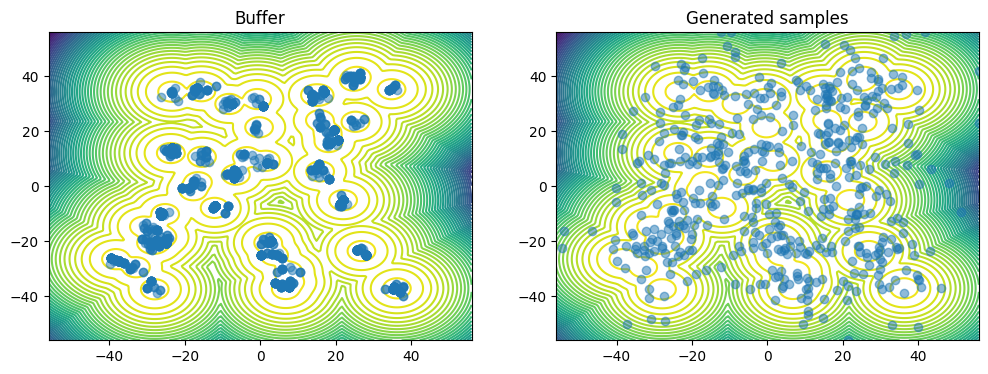

  2%|▏         | 201/10000 [01:42<3:50:06,  1.41s/it]

Epoch 0 | Loss 3934.287598


  2%|▏         | 202/10000 [01:42<3:02:40,  1.12s/it]

Epoch 0 | Loss 1808.739502


  2%|▏         | 203/10000 [01:43<2:29:08,  1.09it/s]

Epoch 0 | Loss 2857.393066


  2%|▏         | 204/10000 [01:43<2:06:50,  1.29it/s]

Epoch 0 | Loss 998.975464


  2%|▏         | 205/10000 [01:44<1:50:16,  1.48it/s]

Epoch 0 | Loss 1373.822266


  2%|▏         | 206/10000 [01:44<1:58:08,  1.38it/s]

Epoch 0 | Loss 3430.168213


  2%|▏         | 207/10000 [01:45<1:44:36,  1.56it/s]

Epoch 0 | Loss 1312.047852


  2%|▏         | 208/10000 [01:45<1:35:10,  1.71it/s]

Epoch 0 | Loss 614.407104


  2%|▏         | 209/10000 [01:46<1:27:56,  1.86it/s]

Epoch 0 | Loss 8471.399414


  2%|▏         | 210/10000 [01:46<1:22:47,  1.97it/s]

Epoch 0 | Loss 1459.835938


  2%|▏         | 211/10000 [01:47<1:19:10,  2.06it/s]

Epoch 0 | Loss 3181.195557


  2%|▏         | 212/10000 [01:47<1:17:08,  2.11it/s]

Epoch 0 | Loss 1988.977173


  2%|▏         | 213/10000 [01:47<1:15:18,  2.17it/s]

Epoch 0 | Loss 1785.005615


  2%|▏         | 214/10000 [01:48<1:14:23,  2.19it/s]

Epoch 0 | Loss 2352.809570


  2%|▏         | 215/10000 [01:48<1:13:33,  2.22it/s]

Epoch 0 | Loss 1569.254761


  2%|▏         | 216/10000 [01:49<1:12:46,  2.24it/s]

Epoch 0 | Loss 2327.293945


  2%|▏         | 217/10000 [01:49<1:12:23,  2.25it/s]

Epoch 0 | Loss 1472.440063


  2%|▏         | 218/10000 [01:50<1:12:08,  2.26it/s]

Epoch 0 | Loss 3681.155029


  2%|▏         | 219/10000 [01:50<1:12:41,  2.24it/s]

Epoch 0 | Loss 1745.337036


  2%|▏         | 220/10000 [01:51<1:12:13,  2.26it/s]

Epoch 0 | Loss 1746.737793


  2%|▏         | 221/10000 [01:51<1:11:58,  2.26it/s]

Epoch 0 | Loss 3179.799316


  2%|▏         | 222/10000 [01:51<1:11:48,  2.27it/s]

Epoch 0 | Loss 839.310486


  2%|▏         | 223/10000 [01:52<1:12:30,  2.25it/s]

Epoch 0 | Loss 9476.087891


  2%|▏         | 224/10000 [01:52<1:12:25,  2.25it/s]

Epoch 0 | Loss 83971.203125


  2%|▏         | 225/10000 [01:53<1:11:59,  2.26it/s]

Epoch 0 | Loss 1356.567627


  2%|▏         | 226/10000 [01:53<1:12:13,  2.26it/s]

Epoch 0 | Loss 2865.134277


  2%|▏         | 227/10000 [01:54<1:12:02,  2.26it/s]

Epoch 0 | Loss 3414.604980


  2%|▏         | 228/10000 [01:54<1:11:51,  2.27it/s]

Epoch 0 | Loss 552.770569


  2%|▏         | 229/10000 [01:55<1:11:41,  2.27it/s]

Epoch 0 | Loss 1721.205933


  2%|▏         | 230/10000 [01:55<1:11:24,  2.28it/s]

Epoch 0 | Loss 1097.465576


  2%|▏         | 231/10000 [01:55<1:11:17,  2.28it/s]

Epoch 0 | Loss 1146.532959


  2%|▏         | 232/10000 [01:56<1:11:20,  2.28it/s]

Epoch 0 | Loss 4404.439453


  2%|▏         | 233/10000 [01:56<1:11:48,  2.27it/s]

Epoch 0 | Loss 1415.265015


  2%|▏         | 234/10000 [01:57<1:11:30,  2.28it/s]

Epoch 0 | Loss 2519.133545


  2%|▏         | 235/10000 [01:57<1:12:08,  2.26it/s]

Epoch 0 | Loss 2005.206177


  2%|▏         | 236/10000 [01:58<1:11:46,  2.27it/s]

Epoch 0 | Loss 1581.454956


  2%|▏         | 237/10000 [01:58<1:11:41,  2.27it/s]

Epoch 0 | Loss 2267.071777


  2%|▏         | 238/10000 [01:58<1:11:31,  2.27it/s]

Epoch 0 | Loss 2278.443848


  2%|▏         | 239/10000 [01:59<1:11:26,  2.28it/s]

Epoch 0 | Loss 1625.370972


  2%|▏         | 240/10000 [01:59<1:11:20,  2.28it/s]

Epoch 0 | Loss 4161.600098


  2%|▏         | 241/10000 [02:00<1:11:16,  2.28it/s]

Epoch 0 | Loss 1628.250732


  2%|▏         | 242/10000 [02:00<1:11:14,  2.28it/s]

Epoch 0 | Loss 1509.450439


  2%|▏         | 243/10000 [02:01<1:11:09,  2.29it/s]

Epoch 0 | Loss 2105.187988


  2%|▏         | 244/10000 [02:01<1:11:06,  2.29it/s]

Epoch 0 | Loss 5551.604492


  2%|▏         | 245/10000 [02:02<1:11:00,  2.29it/s]

Epoch 0 | Loss 769.826355


  2%|▏         | 246/10000 [02:02<1:11:17,  2.28it/s]

Epoch 0 | Loss 1082.141113


  2%|▏         | 247/10000 [02:02<1:20:53,  2.01it/s]


KeyboardInterrupt: 

In [478]:
def score_wrapper(vectorfield):
    def score(x, t, noise_schedule):
        h_t = noise_schedule.h(t)
        #h_t = beta * t
        return vectorfield(x, t)# / (h_t + 5e-3).unsqueeze(1)
    
    return score

all_losses = []
binned_losses = [[] for _ in range(10)]
for outer_epoch in tqdm(range(outer_epochs)):
    for epoch in range(inner_epochs):
        total_loss = 0.
        for samples,_ in init_loader:
            samples = samples.to(device)
            opt_vectorfield.zero_grad()
            #t = torch.rand(len(samples), device=device)

            # 80 % sample from (0, 0.1), 20% sample from (0.1, 1)
            # x0 is data
            low_time_t = (-0.1 * torch.rand(len(samples), device=device)) + 0.1
            high_time_t = (-0.9 * torch.rand(len(samples), device=device)) + 1.0
            mask = torch.rand(len(samples), device=device) < 0.9
            t = (low_time_t * mask) + (high_time_t * ~mask)

            t = LogUniform(torch.tensor(0.001, device=device), torch.tensor(1.0, device=device)).sample((len(samples),))
            t = torch.rand(len(samples), device=device)

            #losses = reward_matching_loss_biased(vectorfield, samples, t, noise_schedule) # score_loss(vectorfield, samples, t)
            losses = score_loss(vectorfield, samples, t)
            loss = losses.mean()
            total_loss += loss.item()
            loss.backward()
            opt_vectorfield.step()
            
            all_losses.append(loss.detach().cpu().item())
            
            for i, loss_bin in enumerate(binned_losses):
                bin_start = i / 20.0
                bin_end = bin_start + 0.05
                
                t_idx = (bin_start <= t) & (t <= bin_end)
                bin_losses = losses[t_idx]
                
                if len(bin_losses) > 0:
                    loss_bin.append(bin_losses.mean().detach().cpu())
                
        if epoch % 49 == 0:
            print("Epoch %d | Loss %f" % (epoch, loss.item()))


    # Generate samples using the network

    # Update Buffer 
    #buffer.add(samples, samples_energy)

    if outer_epoch % 100 == 0:
        ve_reverse_sde = VEReverseSDE(score_wrapper(vectorfield), noise_schedule)
    
        noise = torch.randn_like(x1_samples_normalized) * (beta ** 0.5)
        samples = integrate_sde(ve_reverse_sde, noise, [0, 0.999], 1e-3)[0][-1]
        samples_energy = target.log_prob(unnormalize(samples, global_mins, global_maxs)).detach()

        plot_dataset(unnormalize(train_dataset.tensors[0], global_mins, global_maxs), 
                     unnormalize(samples, global_mins, global_maxs))
        plt.show()
        
    # Resample data from the buffer
    samples, samples_energy, _ = buffer.sample(512 * 10)
    train_dataset = TensorDataset(samples, samples_energy)
    trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True)

Text(0.5, 0, 'epoch')

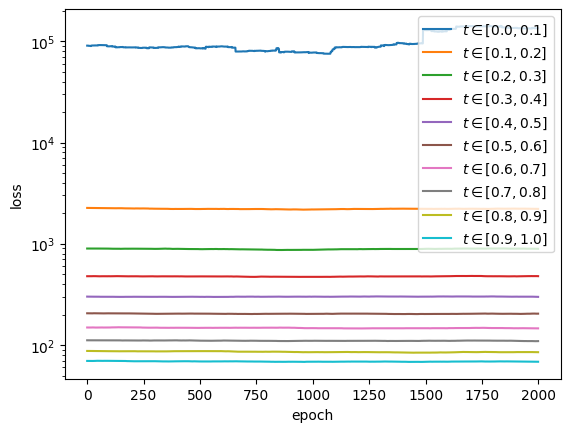

In [479]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w


for i, bin_loss in enumerate(binned_losses):
    plt.plot(moving_average(torch.tensor(bin_loss).cpu().numpy(), 1000)[-2000:], label=r'$t \in [%.1f, %.1f]$' % (i / 10.0, ((i + 1) / 10.0)))
plt.yscale('log')
plt.legend()
plt.ylabel('loss')
plt.xlabel('epoch')

In [ ]:
vf_beta = copy.deepcopy(vectorfield.state_dict())

In [69]:
import copy

vf_sqrt_beta = copy.deepcopy(vectorfield.state_dict())

In [238]:
vectorfield.load_state_dict(vf_beta)

<All keys matched successfully>

### Evaluation

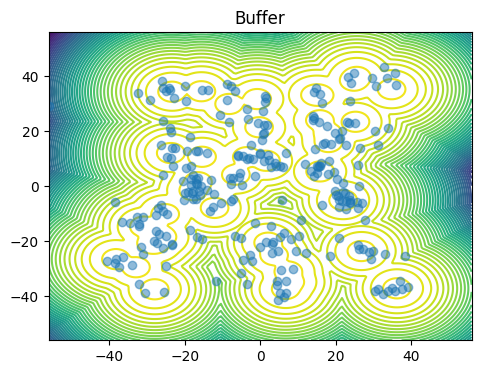

[<Figure size 1200x400 with 1 Axes>]

In [71]:
noise = (torch.randn_like(x1_samples_normalized) * (beta ** 0.5))[:256]
samples = integrate_sde(ve_reverse_sde, noise, [0, 0.999], 1e-3)[0][-1]

plot_dataset(unnormalize(samples, global_mins, global_maxs))

In [283]:
beta = 0.2

In [356]:
from torch.func import jacrev

In [405]:
follow_estimate = False
follow_true = False
follow_model = True

In [406]:
def drift(x, t):
    with torch.enable_grad():
        x.requires_grad = True
        if follow_estimate:
            f = -0.5 * beta * estimate_grad_Rt(x, t, noise_schedule, num_mc_samples=100)
            norm = torch.linalg.vector_norm(f, dim=-1)
            #print(norm.max())
            max_norm = 50
            clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
            f = f * clip_coef.unsqueeze(-1)
        elif follow_true:
            f = - 0.5 * beta * true_grad_Rt(x, t, noise_schedule)
        elif follow_model:
            h_t = noise_schedule.h(t)
            f = - 0.5 * beta * vectorfield(x, t)# / (h_t + 1e-3).unsqueeze(1)
            return f
            norm = torch.linalg.vector_norm(f, dim=-1)
            # print("norm", norm.max())
            max_norm = 1
            clip_coef = torch.clamp(max_norm / (norm+1e-6), max=1)
            f = f  * clip_coef.unsqueeze(-1)
            # print("clipped norm", torch.linalg.vector_norm(f, dim=-1).max())
    return f

In [407]:
def div_fn(u):
    """Accepts a function u:R^D -> R^D."""
    J = jacrev(u)
    def div(x):
        return torch.trace(J(x.unsqueeze(0)).squeeze())
    return div

def output_and_div(vecfield, x):
    if follow_estimate:
        #dx = vecfield(x)
        dx = torch.vmap(vecfield, randomness="different")(x)
        div = torch.vmap(div_fn(vecfield), randomness="different")(x)
    elif follow_true:
        dx = vecfield(x)
        div = torch.vmap(div_fn(vecfield), randomness="different")(x.clone().detach().requires_grad_(True))
    elif follow_model:
        dx = vecfield(x)
        div = torch.vmap(div_fn(vecfield), randomness="different")(x)
    return dx, div

In [408]:
def prior_dist(beta):
    dist = torch.distributions.MultivariateNormal(
        torch.zeros(2).to(device), torch.eye(2).to(device) * beta
    )
    return dist

In [410]:
reverse_time = False

In [411]:
unnorm_test_samples = target.sample((init_num_samples,)).to(device).detach()

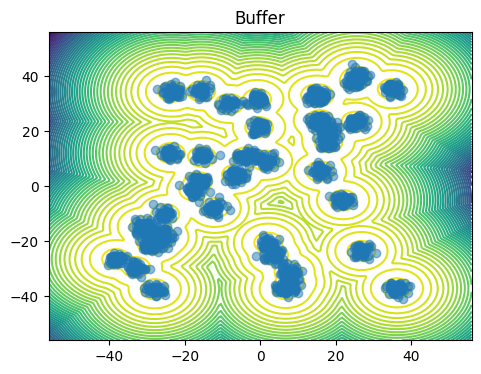

[<Figure size 1200x400 with 1 Axes>]

In [412]:
plot_dataset(unnorm_test_samples)

In [413]:
def odefunc(t, x_in):
    x = x_in[..., :-1].clone().detach().requires_grad_(True)
    t = t.to(device)
    vecfield = lambda x: drift(x, t)
    if follow_model:
        def vecfield(x):
            return drift(x, torch.ones(x.shape[0]).to(device) * t)
    dx, div = output_and_div(vecfield, x)
    div = div.reshape(-1, 1)
    return torch.cat([dx, div], dim=-1)

In [480]:
follow_model = True
follow_estimate = False
with torch.no_grad():
    if reverse_time:
        x1 = torch.randn(1024, 2).to(device) * np.sqrt(beta)
        time = torch.linspace(1, 0, 1000).to(device)
    else:
        x1, _, _ = normalize(unnorm_test_samples)
        time = torch.linspace(0, 1, 1000).to(device)
    state1 = torch.cat([x1, torch.zeros_like(x1[..., :1])], dim=-1)
    state1.requires_grad = True
    states_traj = odeint(odefunc, state1, t=time, method="euler")
    state0 = states_traj[-1]

    x0, logdetjac = state0[..., :-1], state0[..., -1]
    p0 = prior_dist(beta)
    logp0 = p0.log_prob(x0)
    logp1 = -(logp0 + logdetjac)

In [481]:
print("logp0", logp0.mean())
print("logdetjac", logdetjac.mean())
print("logp1", logp1.mean())

logp0 tensor(-2.0773, device='cuda:0')
logdetjac tensor(1.4701, device='cuda:0')
logp1 tensor(0.6072, device='cuda:0')


In [529]:
log_p0_true = true_Rt(prior_samples, torch.tensor(1).to(device), beta)
print("logp0 true: ", log_p0_true.mean())

logp0 true:  tensor(-9.3199, device='cuda:0')


In [530]:
log_p0_true = true_Rt(x0, torch.tensor(1).to(device), beta)
print("logp0 true: ", log_p0_true.mean())

logp0 true:  tensor(-9.7362, device='cuda:0')


In [531]:
-(log_p0_true + logdetjac).mean()

tensor(7.3265, device='cuda:0')

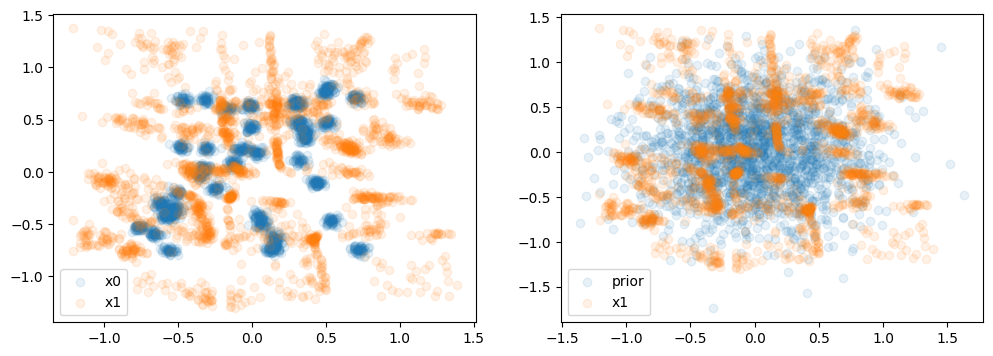

In [482]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].scatter(x1[:, 0].detach().cpu(), x1[:, 1].detach().cpu(), alpha=0.1, label="x0")
ax[0].scatter(x0[:, 0].detach().cpu(), x0[:, 1].detach().cpu(), alpha=0.1, label="x1")


prior_samples = p0.sample((2048,))
if reverse_time:
    ax[0].scatter(prior_samples[:, 0].detach().cpu(), prior_samples[:, 1].detach().cpu(), alpha=0.2, label="prior")
    ax[1].scatter(samples[:, 0].detach().cpu(), samples[:, 1].detach().cpu(), alpha=0.1, label="generated samples")
else:
    ax[1].scatter(prior_samples[:, 0].detach().cpu(), prior_samples[:, 1].detach().cpu(), alpha=0.1, label="prior")
ax[0].legend()

ax[1].scatter(x0[:, 0].detach().cpu(), x0[:, 1].detach().cpu(), alpha=0.1, label="x1")
ax[1].legend()
#plt.xlim(-2, 2)
#plt.ylim(-2, 2)
plt.show()

In [88]:
x0.abs().mean(1).argmax()

tensor(702, device='cuda:0')

In [89]:
x0[702]

tensor([-17.8094,  52.6267], device='cuda:0')

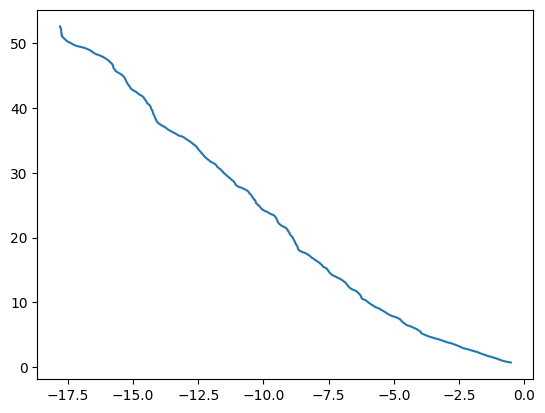

In [94]:
plt.plot(states_traj[:, 702, 0].cpu(), states_traj[:, 702, 1].cpu())

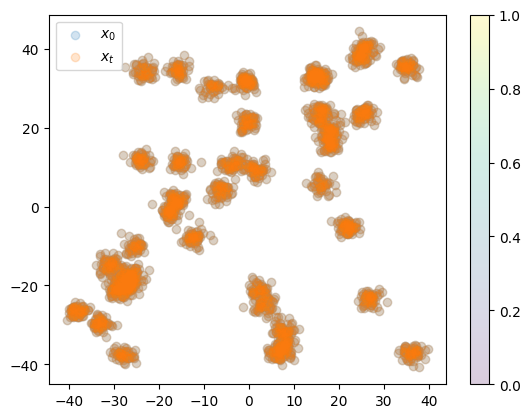

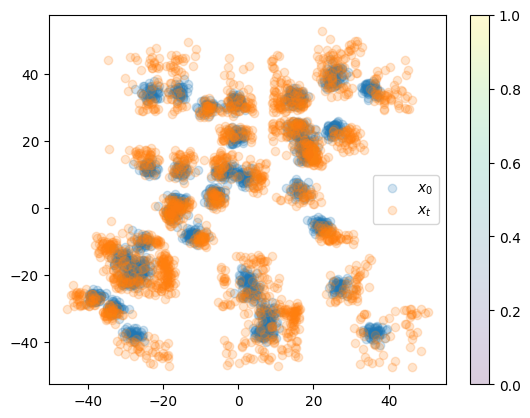

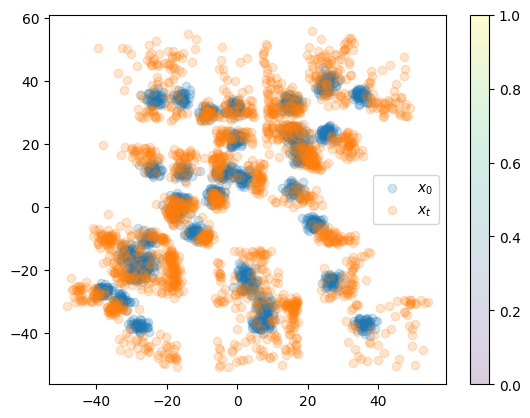

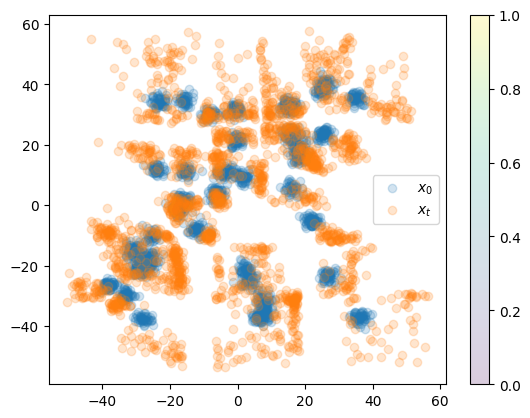

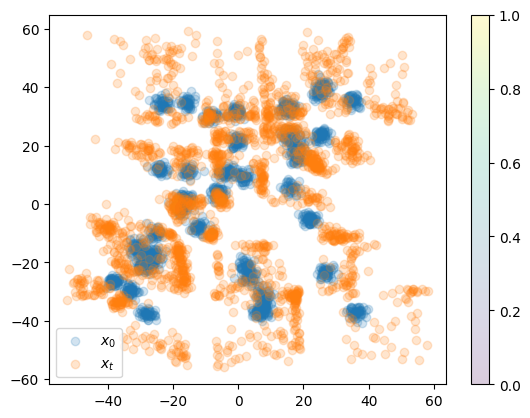

...

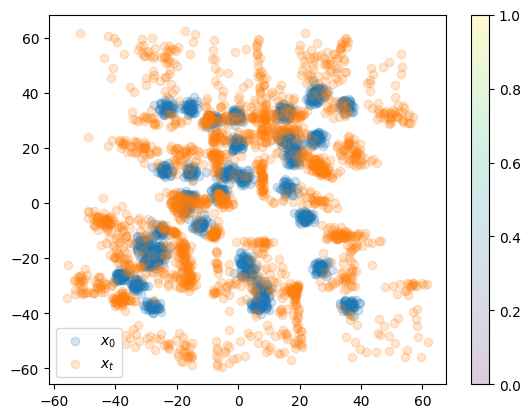

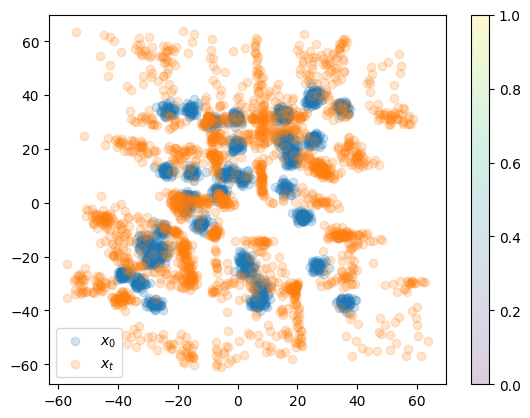

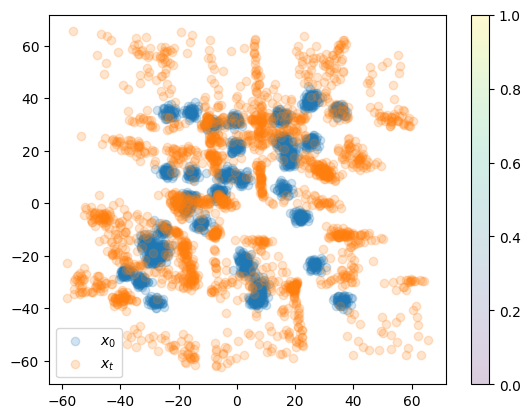

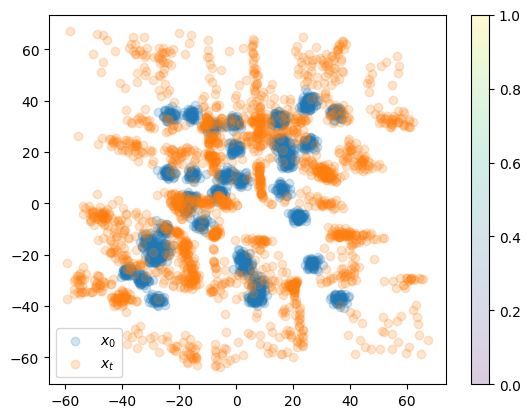

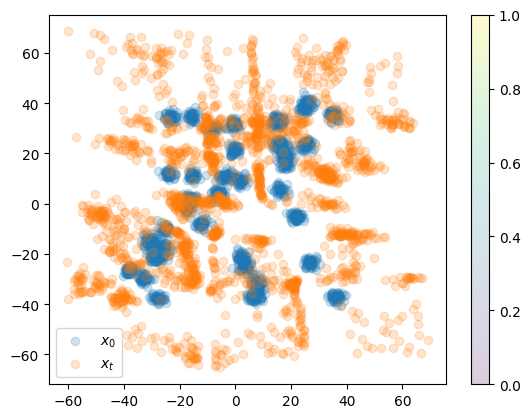

In [503]:
plot_traj = unnormalize(states_traj, global_mins, global_maxs)


for i in range(0, plot_traj.shape[0], 99):
    t = i / float(len(plot_traj))
        
    plt.scatter(plot_traj[0, :, 0].cpu(), plot_traj[0,:,1].cpu(), alpha=0.2, label=r'$x_0$')
    plt.scatter(plot_traj[i, :, 0].cpu(), plot_traj[i,:,1].cpu(), alpha=0.2, label=r'$x_t$')
        
    x_min, x_max = plt.xlim()
    y_min, y_max = plt.ylim()
    
    X = torch.linspace(x_min, x_max, num_grid)
    Y = torch.linspace(y_min, y_max, num_grid)

    # create a grid of (x,y) coordinates
    x = torch.meshgrid(X, Y)

    # make x into tensor
    x = torch.stack(x, dim=2).reshape(-1, 2)
    x = x.to(device)
    #x.requires_grad = True
    
    x = normalize(x)[0]
    vf = drift(x, torch.full((len(x),), fill_value=t, device=device))
    #plt.imshow(vf.reshape(num_grid, num_grid, 2)[..., 1].detach().cpu(), extent=[x_min, x_max, y_min, y_max])

    plt.colorbar()
    plt.legend()

    #plt.ylim(-100, 100)
    plt.show()

In [ ]:
norms = []
learned_norms = []
estimated_norms = []
raw_pred_norms = []
for t in tqdm(torch.linspace(0.0, 1.0, 100)):
    num_grid = 100
    X = torch.linspace(-1, 1, num_grid)
    Y = torch.linspace(-1, 1, num_grid)

    # create a grid of (x,y) coordinates
    x = torch.meshgrid(X, Y)

    # make x into tensor
    x = torch.stack(x, dim=2).reshape(-1, 2)
    x = x.to(device)
    x.requires_grad = True

    t = t.unsqueeze(0)

    h_t = noise_schedule.h(t)

    true = true_grad_Rt(x, t, noise_schedule, var_exploding=True).detach()
    stochastic_estimate = torch.cat([
        estimate_grad_Rt(x.to(device), t.repeat(len(x)).to(device), noise_schedule, num_mc_samples=100).detach().unsqueeze(0)
        for _ in range(10)
    ]).mean(0)
    unaltered_predicted = vectorfield(x.to(device), t.repeat(len(x)).to(device)).cpu().detach()
    predicted = unaltered_predicted / (1e-3 + h_t)

    norms.append(torch.linalg.norm(true, dim=-1).mean())
    learned_norms.append(torch.linalg.norm(predicted, dim=-1).mean())
    raw_pred_norms.append(torch.linalg.norm(unaltered_predicted, dim=-1).mean())
    estimated_norms.append(torch.linalg.norm(stochastic_estimate, dim=-1).mean())

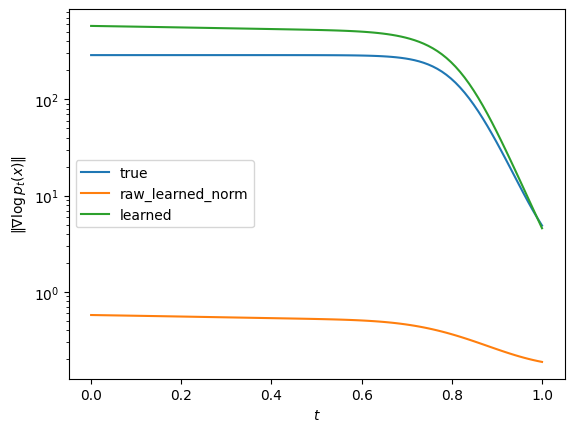

In [197]:
plt.plot(torch.linspace(0.0, 1.0, 100), torch.tensor(norms), label='true')
plt.plot(torch.linspace(0.0, 1.0, 100), torch.tensor(raw_pred_norms), label='raw_learned_norm')
plt.plot(torch.linspace(0.0, 1.0, 100), torch.tensor(learned_norms), label='learned')
plt.legend()
plt.xlabel(r'$t$')
plt.ylabel(r'$\|\nabla \log p_t(x)\|$')
plt.yscale('log')

In [208]:
torch.tensor(raw_pred_norms)[0]

tensor(0.1880)

ValueError: x and y must have same first dimension, but have shapes torch.Size([100]) and torch.Size([0])

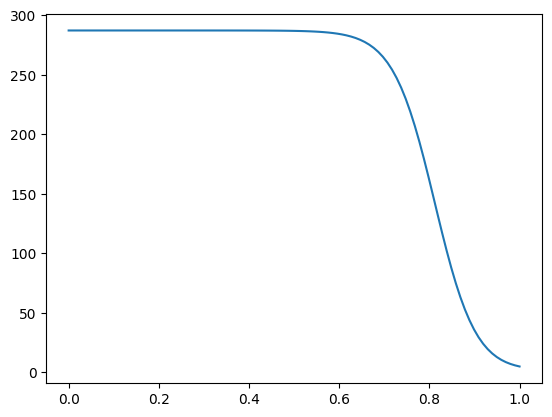

In [194]:
plt.plot(torch.linspace(0.0, 1.0, 100), torch.tensor(norms), label='true')
plt.plot(torch.linspace(0.0, 1.0, 100), torch.tensor(estimated_norms), label='estimated')
plt.plot(torch.linspace(0.0, 1.0, 100), torch.tensor(learned_norms), label='learned')
plt.legend()
plt.xlabel(r'$t$')
plt.ylabel(r'$\|\nabla \log p_t(x)\|$')
plt.yscale('log')

In [408]:
torch.tensor(norms)

tensor([287.0571, 278.8618, 271.1163,  ...,   1.7711,   1.7710,   1.7710])

In [253]:
num_grid = 100
X = torch.linspace(-1, 1, num_grid)
Y = torch.linspace(-1, 1, num_grid)

# create a grid of (x,y) coordinates
x = torch.meshgrid(X, Y)

# make x into tensor
x = torch.stack(x, dim=2).reshape(-1, 2)
x = x.to(device)
x.requires_grad = True

t = torch.rand(1, device=device)
t = t * 0 + 0.99

num_mc_samples = 100

In [254]:
beta * t

tensor([0.1980], device='cuda:0')

In [255]:
h_t = noise_schedule.h(t)

true = true_grad_Rt(x, t, noise_schedule, var_exploding=True).detach()
predicted = (vectorfield(x, t.repeat(len(x))) / (1e-3 + h_t).unsqueeze(1)).cpu().detach()
stochastic_estimate = torch.cat([
    estimate_grad_Rt(x, t.repeat(len(x)), noise_schedule, num_mc_samples=100).detach().unsqueeze(0)
    for _ in tqdm(range(10))
]).mean(0)

100%|██████████| 10/10 [00:00<00:00, 23.73it/s]


In [256]:
print(predicted * (5e-3 + h_t.cpu()))
print(predicted)

tensor([[ 0.4112,  0.5047],
        [ 0.4204,  0.4589],
        [ 0.4244,  0.4163],
        ...,
        [-0.4851, -0.4020],
        [-0.4785, -0.4660],
        [-0.4763, -0.5330]])
tensor([[ 11.0498,  13.5603],
        [ 11.2955,  12.3294],
        [ 11.4042,  11.1859],
        ...,
        [-13.0350, -10.8004],
        [-12.8570, -12.5206],
        [-12.7990, -14.3220]])


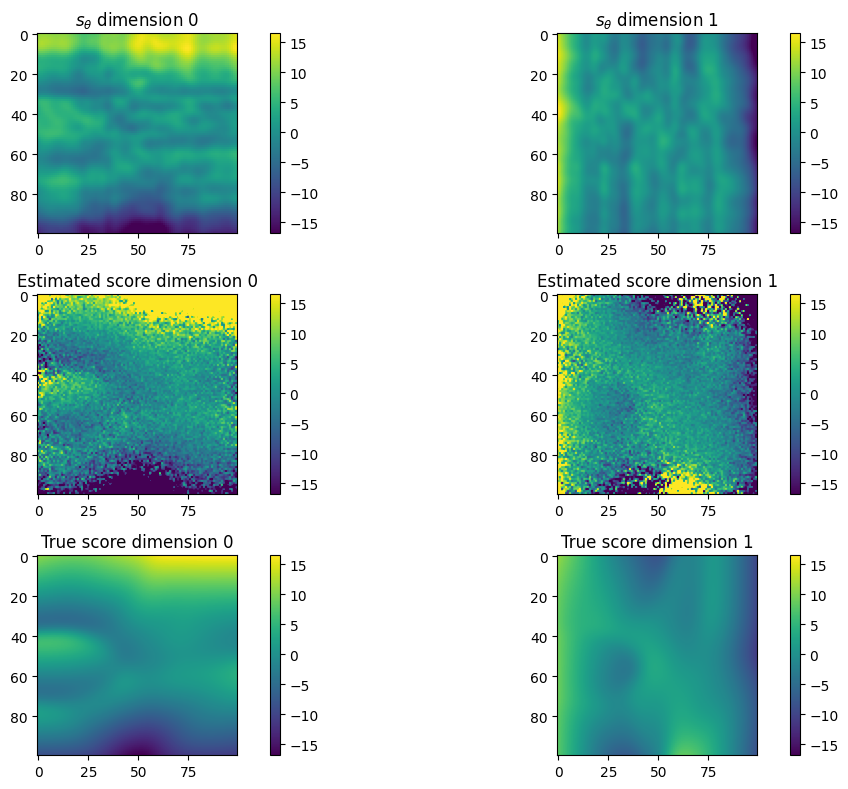

In [257]:
fig, axs = plt.subplots(3, 2, figsize=(12, 8))

vmin = true.min()
vmax = true.max()

im = axs[0,0].imshow(predicted.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[0,0])
axs[0,0].set_title(r'$s_\theta$ dimension 0')

im = axs[0,1].imshow(predicted.reshape(num_grid, num_grid, 2)[..., 1].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[0,1])
axs[0,1].set_title(r'$s_\theta$ dimension 1')
#del grad_Rt
#del grads_Rt

im = axs[1,0].imshow(stochastic_estimate.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[1,0])
axs[1,0].set_title(r'Estimated score dimension 0')

im = axs[1,1].imshow(stochastic_estimate.reshape(num_grid, num_grid, 2)[..., 1].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[1,1])
axs[1,1].set_title(r'Estimated score dimension 1')

im = axs[2,0].imshow(true.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[2,0])
axs[2,0].set_title(r'True score dimension 0')

im = axs[2,1].imshow(true.reshape(num_grid, num_grid, 2)[..., 1].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[2,1])
axs[2,1].set_title(r'True score dimension 1')
#del grad_Rt
#del grads_Rt

plt.tight_layout()
plt.show()

In [100]:
import gc
torch.cuda.empty_cache()
gc.collect()

1496

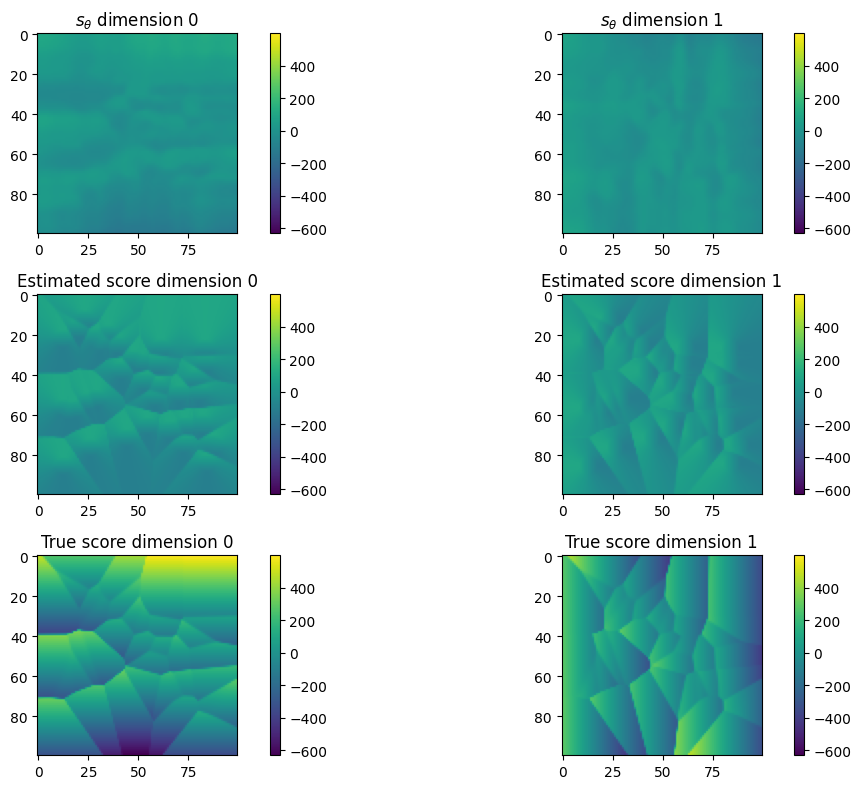

In [430]:
fig, axs = plt.subplots(3, 2, figsize=(12, 8))

vmin = true.min()
vmax = true.max()

im = axs[0,0].imshow(predicted.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[0,0])
axs[0,0].set_title(r'$s_\theta$ dimension 0')

im = axs[0,1].imshow(predicted.reshape(num_grid, num_grid, 2)[..., 1].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[0,1])
axs[0,1].set_title(r'$s_\theta$ dimension 1')
#del grad_Rt
#del grads_Rt

im = axs[1,0].imshow(stochastic_estimate.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[1,0])
axs[1,0].set_title(r'Estimated score dimension 0')

im = axs[1,1].imshow(stochastic_estimate.reshape(num_grid, num_grid, 2)[..., 1].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[1,1])
axs[1,1].set_title(r'Estimated score dimension 1')

im = axs[2,0].imshow(true.reshape(num_grid, num_grid, 2)[..., 0].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[2,0])
axs[2,0].set_title(r'True score dimension 0')

im = axs[2,1].imshow(true.reshape(num_grid, num_grid, 2)[..., 1].cpu(), vmin=vmin, vmax=vmax)
# colorbar for subplot
plt.colorbar(im, ax=axs[2,1])
axs[2,1].set_title(r'True score dimension 1')
#del grad_Rt
#del grads_Rt

plt.tight_layout()
plt.show()